# CNN-RNN Model Training, Dependent Labels
## Author: Ian Scarff (iie728)

In [1]:
import pandas as pd
import numpy as np
import json
import os
import imageio
import matplotlib.pyplot as plt
import seaborn as sns
import random
from sklearn.preprocessing import MultiLabelBinarizer
import time
import datetime

import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torchvision
import torch.nn.functional as F
from torchvision import transforms
from torchvision import models
from torch.utils.data import DataLoader, SubsetRandomSampler
from sklearn.model_selection import KFold
import skimage

from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_score

import warnings
warnings.filterwarnings('ignore')

## Setup

In [2]:
classes = ['Smears', 'Loaded Language', 'Name calling/Labeling', 'Glittering generalities (Virtue)',
               'Appeal to (Strong) Emotions', 'Appeal to fear/prejudice', 'Transfer', 'Doubt',
               'Exaggeration/Minimisation', 'Whataboutism', 'Slogans', 'Flag-waving',
               "Misrepresentation of Someone's Position (Straw Man)", 'Causal Oversimplification',
               'Thought-terminating cliché', 'Black-and-white Fallacy/Dictatorship', 'Appeal to authority',
               'Reductio ad hitlerum', 'Repetition', 'Obfuscation, Intentional vagueness, Confusion',
               'Presenting Irrelevant Data (Red Herring)', 'Bandwagon']

### Create Class Binarizer
one_hot = MultiLabelBinarizer()
one_hot.fit([classes])

MultiLabelBinarizer()

In [3]:
from CustomLoader import ImageLoader

In [4]:
training_data = ImageLoader(json_file = 'training_data.json', root_dir = 'Images',
                           transform = transforms.Compose([
                               transforms.ToTensor(),
                               transforms.Resize(size = (224,224)),
                               transforms.Normalize((0.5,0.5,0.5), (0.5,0.5,0.5)) ### Pixel range [-1,1]
                           ]))

testing_data = ImageLoader(json_file = 'testing_data.json', root_dir = 'Images',
                           transform = transforms.Compose([
                               transforms.ToTensor(),
                               transforms.Resize(size = (224,224)),
                               transforms.Normalize((0.5,0.5,0.5), (0.5,0.5,0.5)) ### Pixel range [-1,1]
                           ]))

In [5]:
train_loader = DataLoader(dataset = training_data, batch_size = 25, shuffle = True)
test_loader = DataLoader(dataset = testing_data, batch_size = 25, shuffle = True)

# 
# 

## Define CNN-RNN Architectures (Set Hidden Size)

In [6]:
class Identity(nn.Module):
    def forward(self, x):
        return x

### ResNet18-LSTM

In [7]:
### Define Class
class ResNet18_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(ResNet18_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Import ResNet18
        resnet18 = models.resnet18(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = resnet18.fc.in_features
        
        resnet18.fc = Identity()
        
        for param in resnet18.parameters():
            param.requires_grad = False
            
        ### CNN Encoder
        self.cnn = resnet18
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)       
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### ResNet50-LSTM

In [8]:
### Define Class
class ResNet50_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(ResNet50_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Import ResNet18
        resnet50 = models.resnet50(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = resnet50.fc.in_features
        
        resnet50.fc = Identity()
        
        for param in resnet50.parameters():
            param.requires_grad = False
        
            
        ### CNN Encoder
        self.cnn = resnet50
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)       
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### ResNet101-LSTM

In [9]:
### Define Class
class ResNet101_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(ResNet101_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Import ResNet18
        resnet101 = models.resnet101(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = resnet101.fc.in_features
        
        resnet101.fc = Identity()
        
        for param in resnet101.parameters():
            param.requires_grad = False
        
            
        ### CNN Encoder
        self.cnn = resnet101
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images) 
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### DenseNet121-LSTM

In [10]:
### Define Class
class DenseNet121_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(DenseNet121_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Import DenseNet101
        densenet121 = models.densenet121(pretrained = True)
    
        ### CNN output size
        self.cnn_output_size = densenet121.classifier.in_features
        
        densenet121.classifier = Identity()

        ### CNN Encoder
        self.cnn = densenet121
        
        for param in densenet121.parameters():
            param.requires_grad = False
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images) 
       
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### DenseNet169-LSTM

In [11]:
### Define Class
class DenseNet169_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(DenseNet169_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Import DenseNet101
        densenet169 = models.densenet169(pretrained = True)
    
        ### CNN output size
        self.cnn_output_size = densenet169.classifier.in_features
        
        densenet169.classifier = Identity()
        
        for param in densenet169.parameters():
            param.requires_grad = False

        ### CNN Encoder
        self.cnn = densenet169
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images) 
           
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### DenseNet201-LSTM

In [12]:
### Define Class
class DenseNet201_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(DenseNet201_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
               
        
        ### Import DenseNet101
        densenet201 = models.densenet201(pretrained = True)
    
        ### CNN output size
        self.cnn_output_size = densenet201.classifier.in_features
        
        densenet201.classifier = Identity()
        
        for param in densenet201.parameters():
            param.requires_grad = False

        ### CNN Encoder
        self.cnn = densenet201
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)         
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### VGG11_BN-LSTM

In [13]:
### Define Class
class VGG11_BN_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(VGG11_BN_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        ### Import VGG11-BN
        vgg11bn = models.vgg11_bn(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = vgg11bn.classifier[6].in_features
        
        vgg11bn.classifier[6] = Identity()
        
        for param in vgg11bn.parameters():
            param.requires_grad = False

            
            
        ### CNN Encoder
        self.cnn = vgg11bn
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)         
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### VGG16_BN-LSTM

In [14]:
### Define Class
class VGG16_BN_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(VGG16_BN_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        ### Import VGG11-BN
        vgg16bn = models.vgg16_bn(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = vgg16bn.classifier[6].in_features
        
        vgg16bn.classifier[6] = Identity()
        
        for param in vgg16bn.parameters():
            param.requires_grad = False

            
            
        ### CNN Encoder
        self.cnn = vgg16bn
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
    
    
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)         
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### VGG19_BN-LSTM

In [15]:
### Define Class
class VGG19_BN_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(VGG19_BN_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        ### Import VGG11-BN
        vgg19bn = models.vgg19_bn(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = vgg19bn.classifier[6].in_features
        
        vgg19bn.classifier[6] = Identity()
        
        for param in vgg19bn.parameters():
            param.requires_grad = False

            
            
        ### CNN Encoder
        self.cnn = vgg19bn
        
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
    
    
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)         
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

# 
# 
# 

## Define Training Methodology

In [16]:
def get_lr(optim):
    for param_group in optim.param_groups:
        return param_group['lr']

In [17]:
### This function is used to train a cnn model
def Kfold_train_CNN_RNN(model = None, training_data = None, learning_rate = None, k_folds = None, n_epochs = None, model_name = None):
    
    ### Check that all entries are valid
    if ((model == None) or (training_data == None) or (model_name == None) or 
        (learning_rate == None) or (k_folds == None) or (n_epochs == None)):
        print ('Enter all info.')
        
        
        
    ### Run K-Fold CV
    else:
        
        device = 'cpu'

        ### Set Loss Function and Optimizer
        criterion = nn.BCELoss()
        
        
        #### Define the K-fold Cross Validator
        kfold = KFold(n_splits=k_folds, shuffle=True)
        
        
        
        ### Create values to hold the best model metrics across folds
        val_f1_mic_max = 0 ### This determines best model
        
        best_train_loss = 0
        best_train_acc = 0
        best_train_f1_mic = 0
        best_train_f1_mac = 0
        best_train_prec_mic = 0
        best_train_prec_mac = 0
        best_train_rec_mic = 0
        best_train_rec_mac = 0

        best_val_acc = 0
        best_val_loss = 0
#         best_val_f1_mic = 0
        best_val_f1_mac = 0
        best_val_prec_mic = 0
        best_val_prec_mac = 0
        best_val_rec_mic = 0
        best_val_rec_mac = 0
        
        best_fold = 0
        best_epoch = 0
        

        
        ### Start print

        start = time.time()
        
        ### K-fold Cross Validation model evaluation
        for fold, (train_ids, val_ids) in enumerate(kfold.split(training_data)):
            
            print('-------------------------------------------')
            print('FOLD {}'.format(fold + 1))
            print('-------------------------------------------')
            
            ### Sample elements randomly from a given list of ids, no replacement
            train_subsampler = SubsetRandomSampler(train_ids)
            val_subsampler = SubsetRandomSampler(val_ids)
            
            ### Define data loaders for training and validation in current fold
            train_loader = DataLoader(dataset = training_data, batch_size = 25, sampler = train_subsampler)
            val_loader = DataLoader(dataset = training_data, batch_size = 25, sampler = val_subsampler)
            
            ### Initialize network
            network = model
            if torch.cuda.is_available():
                network.cuda()
                network = nn.DataParallel(network, list(range(2)))
                device = 'cuda'
            
            ### Initialize optimizer
            optimizer = optim.Adam(model.parameters(), lr=learning_rate)
            scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode = 'min', factor = 0.1, patience = 5)
            
            
            ### Create lists of values at the end of each epoch for each fold
            train_loss = []
            train_acc = []
            train_f1_mic = []
            train_f1_mac = []
            train_prec_mic = []
            train_prec_mac = []
            train_rec_mic = []
            train_rec_mac = []
            
            val_loss = []
            val_acc = []
            val_f1_mic = []
            val_f1_mac = []
            val_prec_mic = []
            val_prec_mac = []
            val_rec_mic = []
            val_rec_mac = []
            
            
            ### Train network
            for epoch in range(n_epochs):
                
                ### Hold training predictions and targets
                train_output = np.empty((0,22), int)
                train_all_targets = np.empty((0,22), int)
                
                val_output = np.empty((0,22), int)
                val_all_targets = np.empty((0,22), int)
                
                
                ### Train ###
                network.train()
                
                train_running_loss = 0.0
                
                batch_number = 0
                for i, data in enumerate(train_loader):
                    
                    images, targets = data[0].to(device), data[1].float().to(device)
                    optimizer.zero_grad()
                    
                    output = network(images)
                    
                    loss = criterion(output, targets) 
                    train_running_loss += loss.item()
                                        
                    ### Append output
                    train_output = np.vstack((train_output, ((output > 0.5).cpu().numpy().astype('int'))))
                    train_all_targets = np.vstack((train_all_targets, targets.cpu().numpy().astype('int')))

                    loss.backward()
                    optimizer.step()
                                        
                    
                ### Calculate metrics and append
                train_loss.append(train_running_loss/len(train_loader.dataset))
                train_acc.append(accuracy_score(train_all_targets, train_output))
                train_f1_mic.append(f1_score(train_all_targets, train_output, average = 'micro'))
                train_f1_mac.append(f1_score(train_all_targets, train_output, average = 'macro'))
                train_prec_mic.append(precision_score(train_all_targets, train_output, average = 'micro'))
                train_prec_mac.append(precision_score(train_all_targets, train_output, average = 'macro'))
                train_rec_mic.append(recall_score(train_all_targets, train_output, average = 'micro'))
                train_rec_mac.append(recall_score(train_all_targets, train_output, average = 'macro'))
                
                
                ### Validate###
                network.eval()
                val_running_loss = 0.0

                                
                for i, data in enumerate(val_loader):
                    images, targets = data[0].to(device), data[1].float().to(device)
                    output = network(images)
                    loss = criterion(output, targets)
                    val_running_loss += loss.item()
                    
                    ### Append output
                    val_output = np.vstack((val_output, ((output > 0.5).cpu().numpy().astype('int'))))
                    val_all_targets = np.vstack((val_all_targets, targets.cpu().numpy().astype('int')))

                
                ### Calculate metrics and append
                val_loss.append(val_running_loss/len(val_loader.dataset))
                val_acc.append(accuracy_score(val_all_targets, val_output))
                val_f1_mic.append(f1_score(val_all_targets, val_output, average = 'micro'))
                val_f1_mac.append(f1_score(val_all_targets, val_output, average = 'macro'))
                val_prec_mic.append(precision_score(val_all_targets, val_output, average = 'micro'))
                val_prec_mac.append(precision_score(val_all_targets, val_output, average = 'macro'))
                val_rec_mic.append(recall_score(val_all_targets, val_output, average = 'micro'))
                val_rec_mac.append(recall_score(val_all_targets, val_output, average = 'macro'))
                
                
                ### Save model with the lowest validation loss
                if val_f1_mic[epoch] > val_f1_mic_max:
                    print('Validation F1 Micro Score Increased ({:.6f} --> {:.6f}).  Saving model ...\n'.format(
                    val_f1_mic_max,
                    val_f1_mic[epoch]))
                    torch.save(network.state_dict(), 'BestCnnRnnModels_10folds/' + model_name +'.pt')
                    val_f1_mic_max = val_f1_mic[epoch]
                    
                    ### Set current best metrics
                    best_train_loss = train_loss[epoch]
                    best_train_acc = train_acc[epoch]
                    best_train_f1_mic = train_f1_mic[epoch]
                    best_train_f1_mac = train_f1_mac[epoch]
                    best_train_prec_mic = train_prec_mic[epoch]
                    best_train_prec_mac = train_prec_mac[epoch]
                    best_train_rec_mic = train_rec_mic[epoch]
                    best_train_rec_mac = train_rec_mac[epoch]

                    best_val_acc = val_acc[epoch]
                    best_val_loss = val_loss[epoch]
#                     best_val_f1_mic = val_f1_mic[epoch]
                    best_val_f1_mac = val_f1_mac[epoch]
                    best_val_prec_mic = val_prec_mic[epoch]
                    best_val_prec_mac = val_prec_mac[epoch]
                    best_val_rec_mic = val_rec_mic[epoch]
                    best_val_rec_mac = val_rec_mac[epoch]

                    best_fold = fold + 1
                    best_epoch = epoch + 1
                    
                    
                    
                ### Display summary for epoch
                print('Epoch {} \tLearning Rate: {} \tTime (min): {}'.format(epoch+1, get_lr(optimizer), round((time.time()-start)/60, 2)))
                print('Train Loss: {} \tValidation Loss: {}'. format(round(train_loss[epoch], 4),
                                                                     round(val_loss[epoch], 4)))
                print('Train Accuracy: {} \tValidation Accuracy: {}'.format(round(train_acc[epoch], 4),
                                                                            round(val_acc[epoch], 4)))
                print('Train F1 Mirco: {} \tValidation F1 Micro: {}'.format(round(train_f1_mic[epoch], 4),
                                                                            round(val_f1_mic[epoch], 4)))
                print('Train F1 Marco: {} \tValidation F1 Macro: {}'.format(round(train_f1_mac[epoch], 4),
                                                                            round(val_f1_mac[epoch], 4)))
                print('Train Precision Mirco: {} \tValidation Precision Micro: {}'.format(round(train_prec_mic[epoch], 4),
                                                                                          round(val_prec_mic[epoch], 4)))
                print('Train Precision Marco: {} \tValidation Precision Macro: {}'.format(round(train_prec_mac[epoch], 4),
                                                                                          round(val_prec_mac[epoch], 4)))
                print('Train Recall Mirco: {} \tValidation Recall Micro: {}'.format(round(train_rec_mic[epoch], 4),
                                                                                    round(val_rec_mic[epoch], 4)))
                print('Train Recall Marco: {} \tValidation Recall Macro: {}\n'.format(round(train_rec_mac[epoch], 4),
                                                                                    round(val_rec_mac[epoch], 4)))
                
                
                ### Update learning rate if needed
                scheduler.step(val_loss[epoch])
                
                
                
            ### Display summary graph of fold
            fig, (ax1, ax3) = plt.subplots(1,2, figsize = (20,6))
            ax1.set_xlabel('Epoch')
            ax1.set_ylabel('Loss')
            ln1 = ax1.plot(np.arange(start = 1, stop = n_epochs + 1), train_loss, label = 'Train Loss')
            ln2 = ax1.plot(np.arange(start = 1, stop = n_epochs + 1), val_loss, label = 'Val Loss')
            
            ax2 = ax1.twinx()
            ax2.set_ylabel('Accuracy')
            ln3 = ax2.plot(np.arange(start = 1, stop = n_epochs + 1), train_acc, marker = 'o', label = 'Train Acc')
            ln4 = ax2.plot(np.arange(start = 1, stop = n_epochs + 1), val_acc, marker = 'o', label = 'Val Acc')
            
            lns1 = ln1 + ln2 + ln3 + ln4
            labs1 = [l.get_label() for l in lns1]
            
            ax3.set_xlabel('Epoch')
            ax3.set_ylabel('Score')
            ln5 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_f1_mic, marker = 'v', label = 'Train F1 Micro')
            ln6 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_f1_mic, marker = 'v', label = 'Val F1 Micro')
            ln7 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_f1_mac, marker = '^', label = 'Train F1 Macro')
            ln8 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_f1_mac, marker = '^', label = 'Val F1 Micro')
            ln9 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_prec_mic, marker = 'd', label = 'Train Prec. Micro')
            ln10 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_prec_mic, marker = 'd', label = 'Val Prec. Micro')
            ln11 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_prec_mac, marker = 'X', label = 'Train Prec. Macro')
            ln12 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_prec_mac, marker = 'X', label = 'Val Prec. Macro')
            ln13 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_rec_mic, marker = 'P', label = 'Train Rec. Micro')
            ln14 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_rec_mic, marker = 'P', label = 'Val Rec. Micro')
            ln15 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_rec_mac, marker = 's', label = 'Train Rec. Macro')
            ln16 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_rec_mac, marker = 's', label = 'Val Rec. Macro')
            
            lns2 = ln5 + ln6 + ln7 + ln8 +  ln9 + ln10 + ln11 + ln12 + ln13 + ln14 + ln15 + ln16
            labs2 = [l.get_label() for l in lns2]
            
            
            ax1.legend(lns1, labs1, loc = 'upper left', bbox_to_anchor = (1.1,1))
            ax3.legend(lns2, labs2, loc = 'upper left', bbox_to_anchor = (1.05,1))
            fig.tight_layout()
            
            plt.show()
        
        
        
        ### Display metrics of the best model
                
        print('------------------------------------------------------------')
        print('------------------------------------------------------------')
        
        print('\nMetrics of Best Model:')
        print('Fold: {} \tEpoch: {}'.format(best_fold, best_epoch))
        print('Train Loss: {} \tValidation Loss: {}'. format(round(best_train_loss, 4),
                                                             round(best_val_loss, 4)))
        print('Train Accuracy: {} \tValidation Accuracy: {}'.format(round(best_train_acc, 4),
                                                                    round(best_val_acc, 4)))
        print('Train F1 Mirco: {} \tValidation F1 Micro: {}'.format(round(best_train_f1_mic, 4),
                                                                    round(val_f1_mic_max, 4)))
        print('Train F1 Marco: {} \tValidation F1 Macro: {}'.format(round(best_train_f1_mac, 4),
                                                                    round(best_val_f1_mac, 4)))
        print('Train Precision Mirco: {} \tValidation Precision Micro: {}'.format(round(best_train_prec_mic, 4),
                                                                                  round(best_val_prec_mic, 4)))
        print('Train Precision Marco: {} \tValidation Precision Macro: {}'.format(round(best_train_prec_mac, 4),
                                                                                  round(best_val_prec_mac, 4)))
        print('Train Recall Mirco: {} \tValidation Recall Micro: {}'.format(round(best_train_rec_mic, 4),
                                                                            round(best_val_rec_mic, 4)))
        print('Train Recall Marco: {} \tValidation Recall Macro: {}'.format(round(best_train_rec_mac, 4),
                                                                            round(best_val_rec_mac, 4)))
        
        
        ### Return best metrics
        return [best_fold, best_epoch, best_train_loss, best_train_acc, best_train_f1_mic, best_train_f1_mac, best_train_prec_mic, best_train_prec_mac, best_train_rec_mic, best_train_rec_mac,
                best_val_loss, best_val_acc, val_f1_mic_max, best_val_f1_mac, best_val_prec_mic, best_val_prec_mac, best_val_rec_mic, best_val_rec_mac]
  

# 
# 

## Initialize Models: Hidden Size = 700, Number of Layers = 1, Dropout = 0

In [18]:
resnet18LSTM_700_1_0 = ResNet18_LSTM(hiddenSize = 700, numLayers = 1, dpout = 0)
resnet50LSTM_700_1_0 = ResNet50_LSTM(hiddenSize = 700, numLayers = 1, dpout = 0)
resnet101LSTM_700_1_0 = ResNet101_LSTM(hiddenSize = 700, numLayers = 1, dpout = 0)

densenet121LSTM_700_1_0 = DenseNet121_LSTM(hiddenSize = 700, numLayers = 1, dpout = 0)
densenet169LSTM_700_1_0 = DenseNet169_LSTM(hiddenSize = 700, numLayers = 1, dpout = 0)
densenet201LSTM_700_1_0 = DenseNet201_LSTM(hiddenSize = 700, numLayers = 1, dpout = 0)

vgg11bnLSTM_700_1_0 = VGG11_BN_LSTM(hiddenSize = 700, numLayers = 1, dpout = 0)
vgg16bnLSTM_700_1_0 = VGG16_BN_LSTM(hiddenSize = 700, numLayers = 1, dpout = 0)
vgg19bnLSTM_700_1_0 = VGG19_BN_LSTM(hiddenSize = 700, numLayers = 1, dpout = 0)

# 
# 

## Train Models

In [19]:
START = time.time()

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.18
Train Loss: 0.0181 	Validation Loss: 0.0013
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0856 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0515 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.115 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1044 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0682 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0574 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.3
Train Loss: 0.0123 	Validation Loss: 0.0014
Train Accuracy: 0.0076 	Validation Accuracy: 0.0
Train F1 Mirco: 0.018 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0032 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.5161 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0235 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0092 	Validation Recall Micro: 0.0
Train Recal

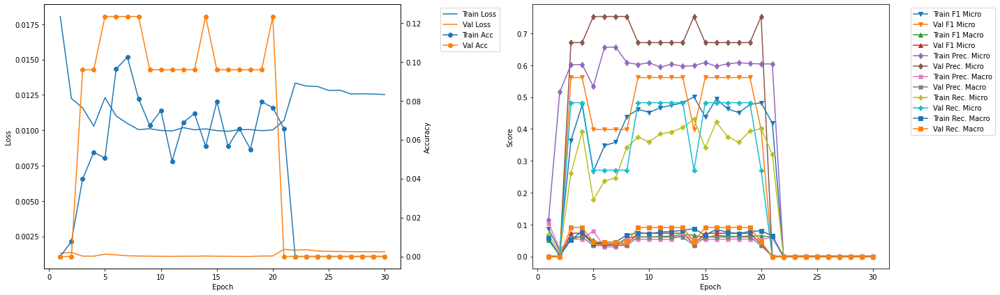

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 3.97
Train Loss: 0.0134 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0181 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0038 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.64 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0291 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0092 	Validation Recall Micro: 0.0
Train Recall Marco: 0.002 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 4.09
Train Loss: 0.0128 	Validation Loss: 0.0014
Train Accuracy: 0.0046 	Validation Accuracy: 0.0137
Train F1 Mirco: 0.0639 	Validation F1 Micro: 0.2836
Train F1 Marco: 0.0118 	Validation F1 Macro: 0.0317
Train Precision Mirco: 0.5842 	Validation Precision Micro: 0.5342
Train Precision Marco: 0.0266 	Validation Precision Macro: 0.0243
Train Recall Mirco: 0.0338 	Validation Recall Micro: 

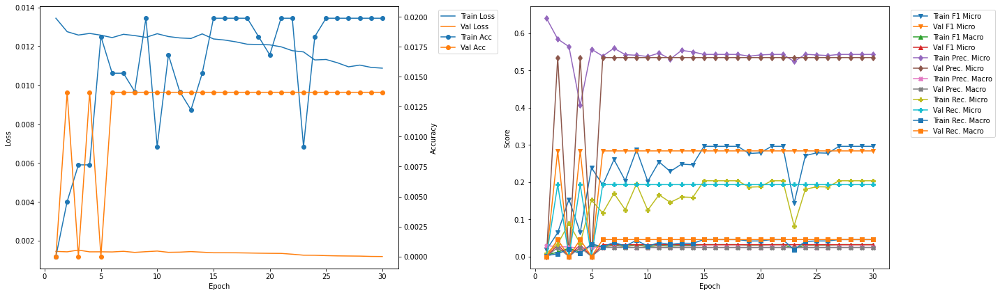

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 7.74
Train Loss: 0.0136 	Validation Loss: 0.0014
Train Accuracy: 0.0122 	Validation Accuracy: 0.0
Train F1 Mirco: 0.1742 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0327 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.3655 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0345 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.1143 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0325 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 7.86
Train Loss: 0.012 	Validation Loss: 0.0013
Train Accuracy: 0.0168 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.2679 	Validation F1 Micro: 0.2824
Train F1 Marco: 0.0304 	Validation F1 Macro: 0.0306
Train Precision Mirco: 0.5406 	Validation Precision Micro: 0.5068
Train Precision Marco: 0.0246 	Validation Precision Macro: 0.023
Train Recall Mirco: 0.178 	Validation Recall Micr

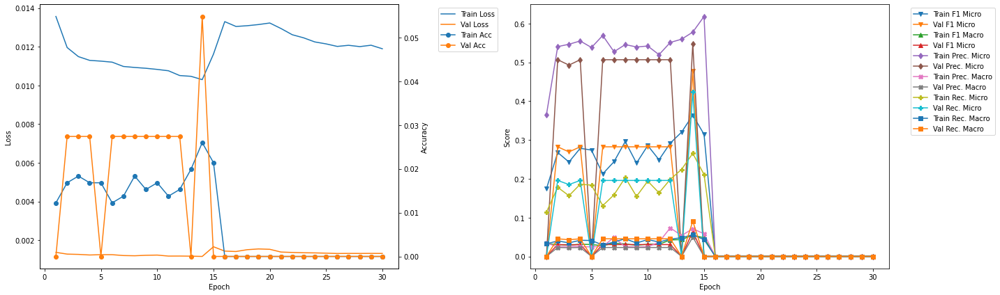

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 11.52
Train Loss: 0.0134 	Validation Loss: 0.0014
Train Accuracy: 0.0015 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0199 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0065 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.36 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0327 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0103 	Validation Recall Micro: 0.0
Train Recall Marco: 0.004 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 11.64
Train Loss: 0.013 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	

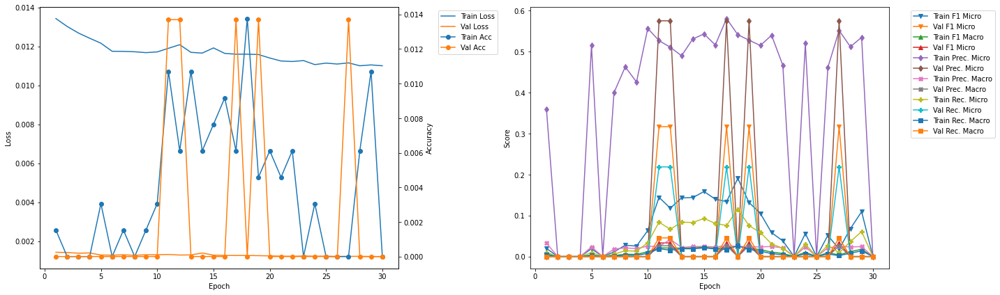

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 15.29
Train Loss: 0.0124 	Validation Loss: 0.0015
Train Accuracy: 0.0092 	Validation Accuracy: 0.0137
Train F1 Mirco: 0.1495 	Validation F1 Micro: 0.2271
Train F1 Marco: 0.0264 	Validation F1 Macro: 0.0271
Train Precision Mirco: 0.51 	Validation Precision Micro: 0.4247
Train Precision Marco: 0.0507 	Validation Precision Macro: 0.0193
Train Recall Mirco: 0.0876 	Validation Recall Micro: 0.155
Train Recall Marco: 0.0208 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 15.42
Train Loss: 0.0121 	Validation Loss: 0.0014
Train Accuracy: 0.0046 	Validation Accuracy: 0.0
Train F1 Mirco: 0.1082 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0176 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.5943 	Validation Precision Micro: 0.0
Train Precision Marco: 0.027 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0595 	Validation Reca

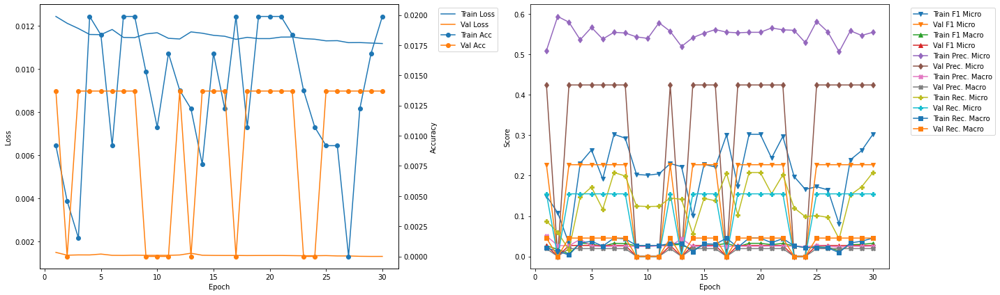

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 19.06
Train Loss: 0.0129 	Validation Loss: 0.0013
Train Accuracy: 0.0107 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.1911 	Validation F1 Micro: 0.292
Train F1 Marco: 0.039 	Validation F1 Macro: 0.0322
Train Precision Mirco: 0.4266 	Validation Precision Micro: 0.5479
Train Precision Marco: 0.0842 	Validation Precision Macro: 0.0249
Train Recall Mirco: 0.1231 	Validation Recall Micro: 0.199
Train Recall Marco: 0.0313 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 19.19
Train Loss: 0.0114 	Validation Loss: 0.0013
Train Accuracy: 0.0168 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.26 	Validation F1 Micro: 0.292
Train F1 Marco: 0.0299 	Validation F1 Macro: 0.0322
Train Precision Mirco: 0.5397 	Validation Precision Micro: 0.5479
Train Precision Marco: 0.0245 	Validation Precision Macro: 0.0249
Train Recall Mirco: 0.1712 	Va

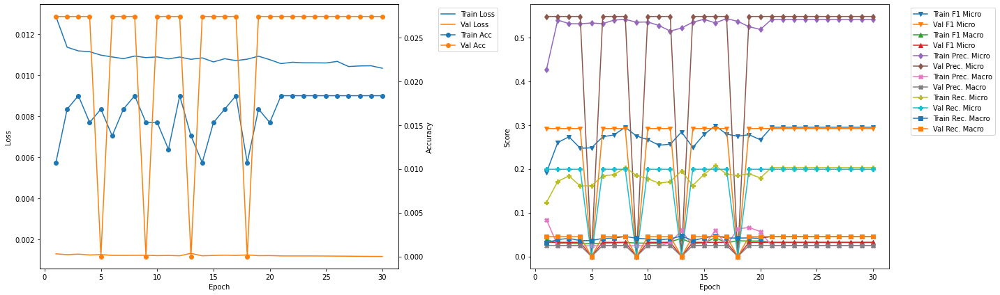

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 22.84
Train Loss: 0.0119 	Validation Loss: 0.0012
Train Accuracy: 0.0153 	Validation Accuracy: 0.0
Train F1 Mirco: 0.2787 	Validation F1 Micro: 0.3123
Train F1 Marco: 0.0622 	Validation F1 Macro: 0.0332
Train Precision Mirco: 0.4251 	Validation Precision Micro: 0.5753
Train Precision Marco: 0.0836 	Validation Precision Macro: 0.0262
Train Recall Mirco: 0.2073 	Validation Recall Micro: 0.2143
Train Recall Marco: 0.0589 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 22.96
Train Loss: 0.0109 	Validation Loss: 0.0012
Train Accuracy: 0.0214 	Validation Accuracy: 0.0
Train F1 Mirco: 0.2824 	Validation F1 Micro: 0.3123
Train F1 Marco: 0.0311 	Validation F1 Macro: 0.0332
Train Precision Mirco: 0.5342 	Validation Precision Micro: 0.5753
Train Precision Marco: 0.0243 	Validation Precision Macro: 0.0262
Train Recall Mirco: 0.1919 	Va

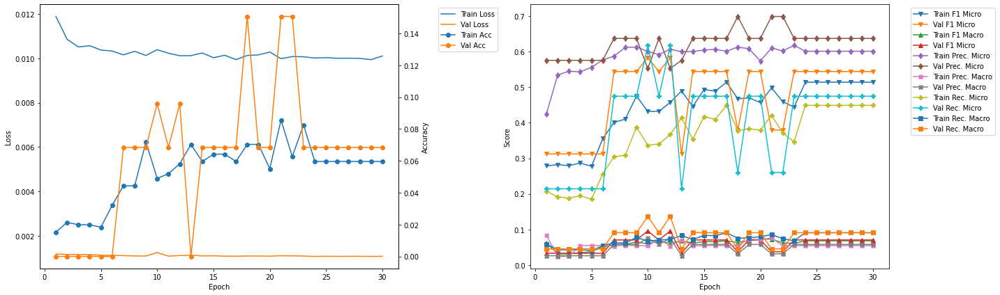

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 26.61
Train Loss: 0.011 	Validation Loss: 0.0011
Train Accuracy: 0.0565 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.4091 	Validation F1 Micro: 0.497
Train F1 Marco: 0.0761 	Validation F1 Macro: 0.066
Train Precision Mirco: 0.5443 	Validation Precision Micro: 0.5694
Train Precision Marco: 0.0786 	Validation Precision Macro: 0.0518
Train Recall Mirco: 0.3277 	Validation Recall Micro: 0.4409
Train Recall Marco: 0.0758 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 26.74
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0656 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.4821 	Validation F1 Micro: 0.3256
Train F1 Marco: 0.0661 	Validation F1 Macro: 0.0335
Train Precision Mirco: 0.6008 	Validation Precision Micro: 0.5833
Train Precision Marco: 0.0636 	Validation Precision Macro: 0.0265
Train Recall Mirco: 0.4026 	V

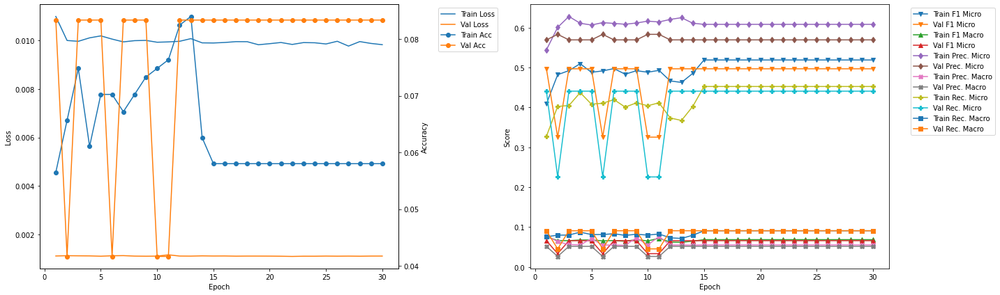

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 30.39
Train Loss: 0.0107 	Validation Loss: 0.001
Train Accuracy: 0.055 	Validation Accuracy: 0.0972
Train F1 Mirco: 0.4117 	Validation F1 Micro: 0.5505
Train F1 Marco: 0.0718 	Validation F1 Macro: 0.0697
Train Precision Mirco: 0.5635 	Validation Precision Micro: 0.625
Train Precision Marco: 0.073 	Validation Precision Macro: 0.0568
Train Recall Mirco: 0.3243 	Validation Recall Micro: 0.4918
Train Recall Marco: 0.071 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 30.52
Train Loss: 0.0104 	Validation Loss: 0.001
Train Accuracy: 0.0656 	Validation Accuracy: 0.1111
Train F1 Mirco: 0.4182 	Validation F1 Micro: 0.3922
Train F1 Marco: 0.0708 	Validation F1 Macro: 0.0373
Train Precision Mirco: 0.578 	Validation Precision Micro: 0.6944
Train Precision Marco: 0.0731 	Validation Precision Macro: 0.0316
Train Recall Mirco: 0.3277 	Val

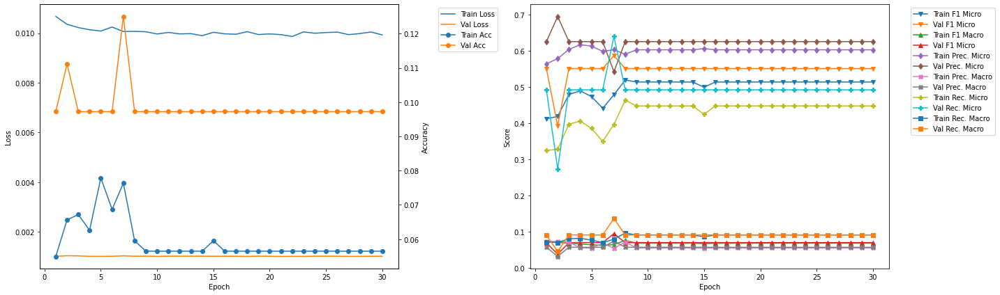

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 34.17
Train Loss: 0.0105 	Validation Loss: 0.0011
Train Accuracy: 0.0718 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.4431 	Validation F1 Micro: 0.5192
Train F1 Marco: 0.0718 	Validation F1 Macro: 0.0688
Train Precision Mirco: 0.5877 	Validation Precision Micro: 0.6111
Train Precision Marco: 0.0739 	Validation Precision Macro: 0.0556
Train Recall Mirco: 0.3556 	Validation Recall Micro: 0.4513
Train Recall Marco: 0.074 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 34.29
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0748 	Validation Accuracy: 0.1111
Train F1 Mirco: 0.5025 	Validation F1 Micro: 0.3596
Train F1 Marco: 0.0672 	Validation F1 Macro: 0.0364
Train Precision Mirco: 0.6166 	Validation Precision Micro: 0.6667
Train Precision Marco: 0.0556 	Validation Precision Macro: 0.0303
Train Recall Mirco: 0.42

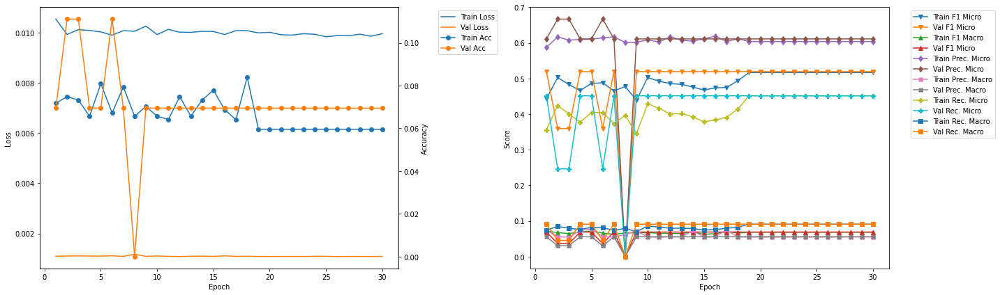

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 9 	Epoch: 7
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.0763 	Validation Accuracy: 0.125
Train F1 Mirco: 0.4781 	Validation F1 Micro: 0.5865
Train F1 Marco: 0.0642 	Validation F1 Macro: 0.0945
Train Precision Mirco: 0.6026 	Validation Precision Micro: 0.5417
Train Precision Marco: 0.0539 	Validation Precision Macro: 0.0739
Train Recall Mirco: 0.3963 	Validation Recall Micro: 0.6393
Train Recall Marco: 0.0794 	Validation Recall Macro: 0.1364


In [20]:
resnet18LSTM_700_1_0_best = Kfold_train_CNN_RNN(model = resnet18LSTM_700_1_0, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'resnet18LSTM_700_1_0')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.14
Train Loss: 0.0171 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0011 	Validation F1 Micro: 0.0
Train F1 Marco: 0.001 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0312 	Validation Precision Micro: 0.0
Train Precision Marco: 0.002 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0006 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0007 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.28
Train Loss: 0.0125 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Val

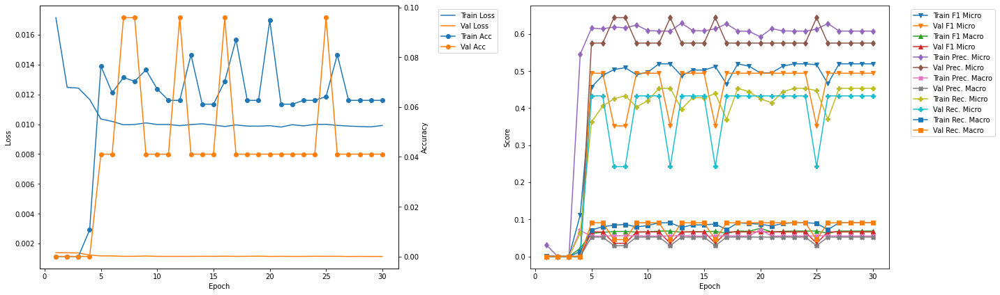

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 4.4
Train Loss: 0.0107 	Validation Loss: 0.0017
Train Accuracy: 0.0673 	Validation Accuracy: 0.0
Train F1 Mirco: 0.4649 	Validation F1 Micro: 0.199
Train F1 Marco: 0.0737 	Validation F1 Macro: 0.0448
Train Precision Mirco: 0.577 	Validation Precision Micro: 0.1929
Train Precision Marco: 0.0792 	Validation Precision Macro: 0.0451
Train Recall Mirco: 0.3893 	Validation Recall Micro: 0.2054
Train Recall Marco: 0.0815 	Validation Recall Macro: 0.0813

Validation F1 Micro Score Increased (0.494118 --> 0.555891).  Saving model ...

Epoch 2 	Learning Rate: 0.01 	Time (min): 4.55
Train Loss: 0.0107 	Validation Loss: 0.0011
Train Accuracy: 0.052 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.297 	Validation F1 Micro: 0.5559
Train F1 Marco: 0.0537 	Validation F1 Macro: 0.0703
Train Precision Mirco: 0.5355 	Validation Precision Micro: 0.6301
Train Precision Marc

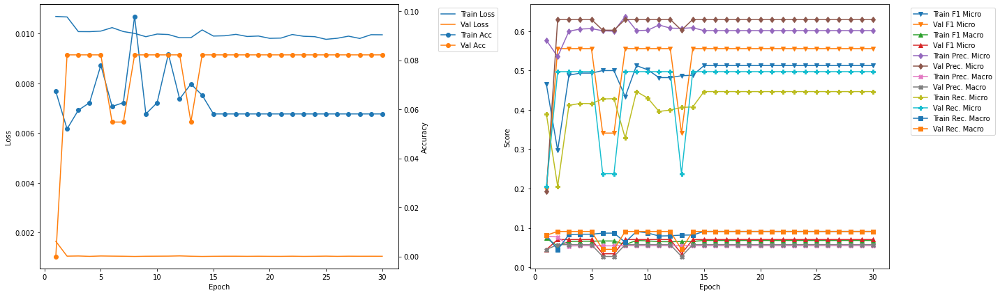

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 8.66
Train Loss: 0.01 	Validation Loss: 0.0018
Train Accuracy: 0.0765 	Validation Accuracy: 0.0
Train F1 Mirco: 0.5066 	Validation F1 Micro: 0.0145
Train F1 Marco: 0.0711 	Validation F1 Macro: 0.0024
Train Precision Mirco: 0.5978 	Validation Precision Micro: 0.0274
Train Precision Marco: 0.0796 	Validation Precision Macro: 0.0012
Train Recall Mirco: 0.4395 	Validation Recall Micro: 0.0099
Train Recall Marco: 0.089 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 8.8
Train Loss: 0.0104 	Validation Loss: 0.0011
Train Accuracy: 0.0703 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.407 	Validation F1 Micro: 0.523
Train F1 Marco: 0.0568 	Validation F1 Macro: 0.0694
Train Precision Mirco: 0.5841 	Validation Precision Micro: 0.6233
Train Precision Marco: 0.0543 	Validation Precision Macro: 0.0567
Train Recall Mirco: 0.3123 	Validat

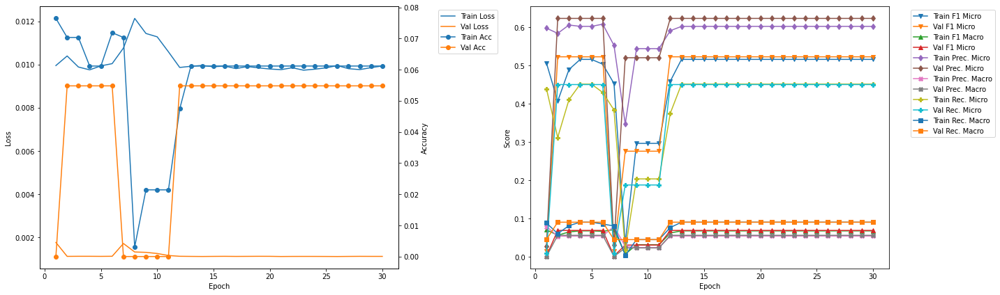

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 12.92
Train Loss: 0.0104 	Validation Loss: 0.0012
Train Accuracy: 0.0581 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4643 	Validation F1 Micro: 0.5156
Train F1 Marco: 0.075 	Validation F1 Macro: 0.0698
Train Precision Mirco: 0.5887 	Validation Precision Micro: 0.6233
Train Precision Marco: 0.081 	Validation Precision Macro: 0.0567
Train Recall Mirco: 0.3833 	Validation Recall Micro: 0.4396
Train Recall Marco: 0.0804 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 13.06
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0688 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.492 	Validation F1 Micro: 0.5156
Train F1 Marco: 0.0655 	Validation F1 Macro: 0.0698
Train Precision Mirco: 0.6078 	Validation Precision Micro: 0.6233
Train Precision Marco: 0.0546 	Validation Precision Macro: 0.0567
Train Recall Mirco: 0.4132 

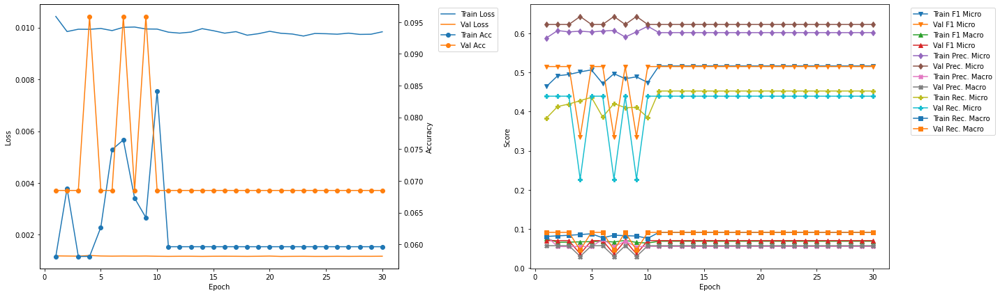

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 17.17
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0612 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.5099 	Validation F1 Micro: 0.4954
Train F1 Marco: 0.068 	Validation F1 Macro: 0.0628
Train Precision Mirco: 0.6137 	Validation Precision Micro: 0.5479
Train Precision Marco: 0.0556 	Validation Precision Macro: 0.0498
Train Recall Mirco: 0.4362 	Validation Recall Micro: 0.452
Train Recall Marco: 0.0876 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 17.31
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0642 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.5192 	Validation F1 Micro: 0.4954
Train F1 Marco: 0.0688 	Validation F1 Macro: 0.0628
Train Precision Mirco: 0.6109 	Validation Precision Micro: 0.5479
Train Precision Marco: 0.0555 	Validation Precision Macro: 0.0498
Train Recall Mirco: 0.4514

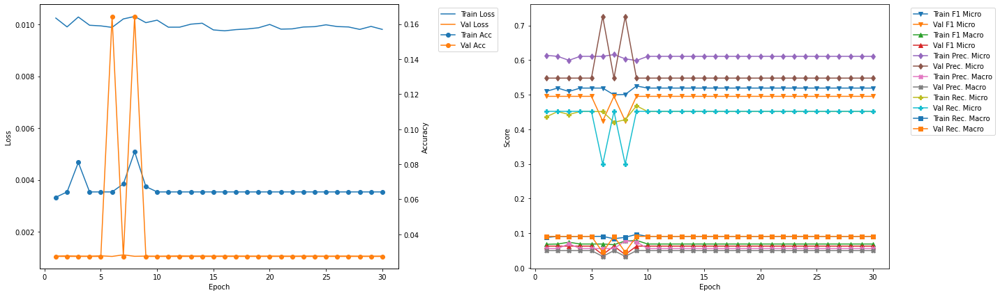

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 21.42
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0627 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.4907 	Validation F1 Micro: 0.5329
Train F1 Marco: 0.0656 	Validation F1 Macro: 0.0688
Train Precision Mirco: 0.6026 	Validation Precision Micro: 0.6096
Train Precision Marco: 0.0542 	Validation Precision Macro: 0.0554
Train Recall Mirco: 0.4139 	Validation Recall Micro: 0.4734
Train Recall Marco: 0.0829 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 21.56
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0566 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.5152 	Validation F1 Micro: 0.5329
Train F1 Marco: 0.0683 	Validation F1 Macro: 0.0688
Train Precision Mirco: 0.604 	Validation Precision Micro: 0.6096
Train Precision Marco: 0.0549 	Validation Precision Macro: 0.0554
Train Recall Mirco: 0.4491 	Val

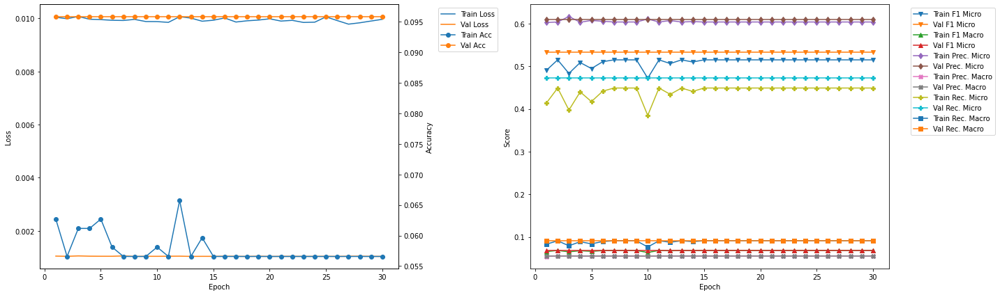

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 25.67
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0581 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4784 	Validation F1 Micro: 0.5419
Train F1 Marco: 0.0641 	Validation F1 Macro: 0.0723
Train Precision Mirco: 0.6055 	Validation Precision Micro: 0.6644
Train Precision Marco: 0.0542 	Validation Precision Macro: 0.0604
Train Recall Mirco: 0.3954 	Validation Recall Micro: 0.4575
Train Recall Marco: 0.0785 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 25.81
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0612 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.514 	Validation F1 Micro: 0.5419
Train F1 Marco: 0.0679 	Validation F1 Macro: 0.0723
Train Precision Mirco: 0.5979 	Validation Precision Micro: 0.6644
Train Precision Marco: 0.0544 	Validation Precision Macro: 0.0604
Train Recall Mirco: 0.4507 	Va

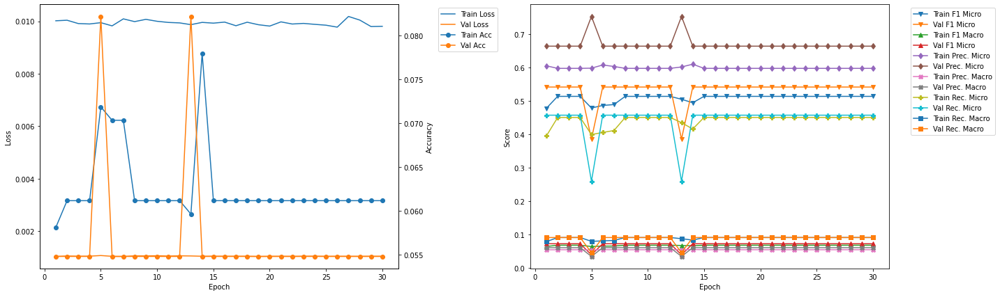

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 29.91
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0611 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.491 	Validation F1 Micro: 0.5136
Train F1 Marco: 0.0657 	Validation F1 Macro: 0.0672
Train Precision Mirco: 0.6101 	Validation Precision Micro: 0.5903
Train Precision Marco: 0.0549 	Validation Precision Macro: 0.0537
Train Recall Mirco: 0.4108 	Validation Recall Micro: 0.4545
Train Recall Marco: 0.0819 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 30.06
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0656 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.5048 	Validation F1 Micro: 0.5136
Train F1 Marco: 0.0673 	Validation F1 Macro: 0.0672
Train Precision Mirco: 0.6121 	Validation Precision Micro: 0.5903
Train Precision Marco: 0.0553 	Validation Precision Macro: 0.0537
Train Recall Mirco: 0.4295 

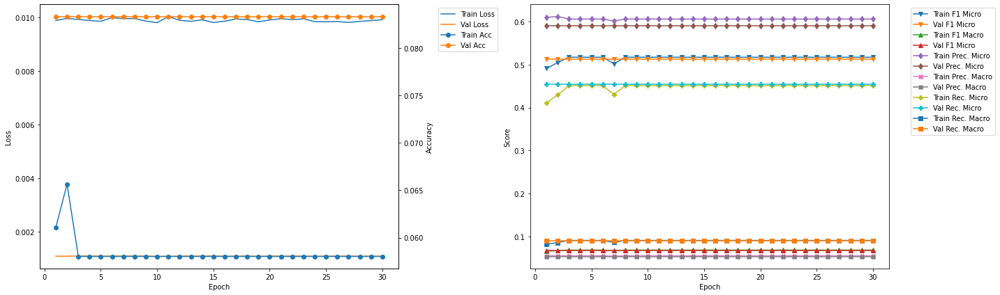

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 34.17
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0626 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.506 	Validation F1 Micro: 0.4957
Train F1 Marco: 0.0669 	Validation F1 Macro: 0.068
Train Precision Mirco: 0.6032 	Validation Precision Micro: 0.5972
Train Precision Marco: 0.0546 	Validation Precision Macro: 0.0543
Train Recall Mirco: 0.4358 	Validation Recall Micro: 0.4236
Train Recall Marco: 0.0866 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 34.31
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0595 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.5193 	Validation F1 Micro: 0.4957
Train F1 Marco: 0.0684 	Validation F1 Macro: 0.068
Train Precision Mirco: 0.6053 	Validation Precision Micro: 0.5972
Train Precision Marco: 0.055 	Validation Precision Macro: 0.0543
Train Recall Mirco: 0.4547 	

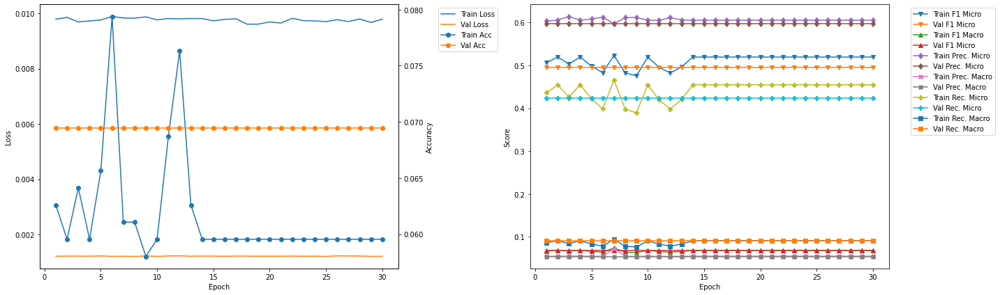

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 38.42
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0733 	Validation Accuracy: 0.0278
Train F1 Mirco: 0.4851 	Validation F1 Micro: 0.5
Train F1 Marco: 0.065 	Validation F1 Macro: 0.0668
Train Precision Mirco: 0.6176 	Validation Precision Micro: 0.5833
Train Precision Marco: 0.0553 	Validation Precision Macro: 0.053
Train Recall Mirco: 0.3994 	Validation Recall Micro: 0.4375
Train Recall Marco: 0.0789 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 38.56
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0641 	Validation Accuracy: 0.0278
Train F1 Mirco: 0.5188 	Validation F1 Micro: 0.5
Train F1 Marco: 0.0685 	Validation F1 Macro: 0.0668
Train Precision Mirco: 0.6069 	Validation Precision Micro: 0.5833
Train Precision Marco: 0.0552 	Validation Precision Macro: 0.053
Train Recall Mirco: 0.453 	Valid

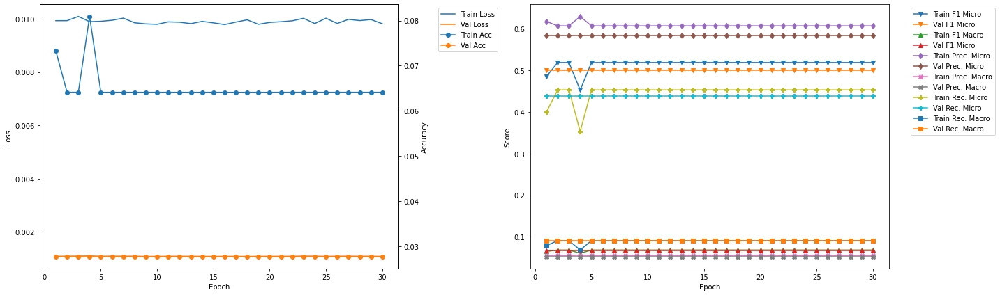

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 2 	Epoch: 2
Train Loss: 0.0107 	Validation Loss: 0.0011
Train Accuracy: 0.052 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.297 	Validation F1 Micro: 0.5559
Train F1 Marco: 0.0537 	Validation F1 Macro: 0.0703
Train Precision Mirco: 0.5355 	Validation Precision Micro: 0.6301
Train Precision Marco: 0.0768 	Validation Precision Macro: 0.0573
Train Recall Mirco: 0.2054 	Validation Recall Micro: 0.4973
Train Recall Marco: 0.0446 	Validation Recall Macro: 0.0909


In [21]:
resnet50LSTM_700_1_0_best = Kfold_train_CNN_RNN(model = resnet50LSTM_700_1_0, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'resnet50LSTM_700_1_0')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.16
Train Loss: 0.02 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0769 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0506 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1201 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1119 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0565 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0656 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.32
Train Loss: 0.0132 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Val

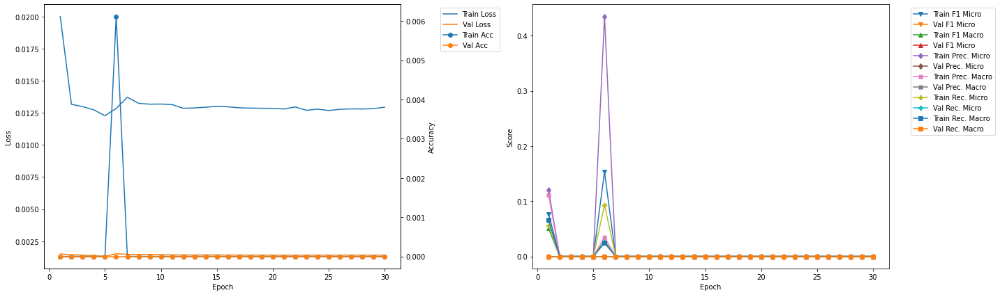

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 4.99
Train Loss: 0.015 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0522 	Validation F1 Micro: 0.0
Train F1 Marco: 0.032 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.14 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1018 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0321 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0239 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 5.15
Train Loss: 0.0133 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Valid

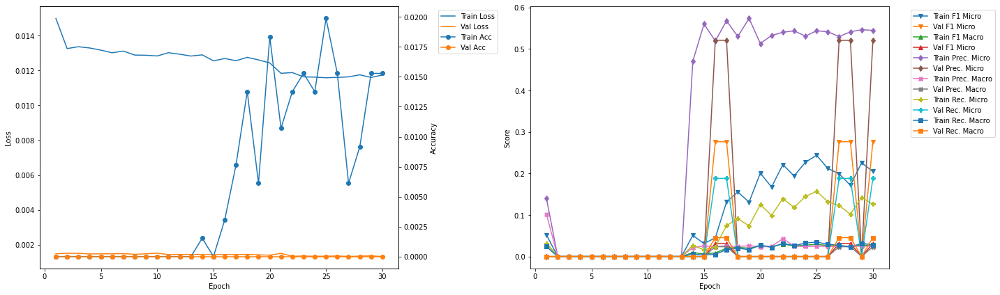

-------------------------------------------
FOLD 3
-------------------------------------------
Validation F1 Micro Score Increased (0.276364 --> 0.333333).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 9.83
Train Loss: 0.0121 	Validation Loss: 0.0012
Train Accuracy: 0.0107 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.2054 	Validation F1 Micro: 0.3333
Train F1 Marco: 0.029 	Validation F1 Macro: 0.0337
Train Precision Mirco: 0.5245 	Validation Precision Micro: 0.589
Train Precision Marco: 0.0407 	Validation Precision Macro: 0.0268
Train Recall Mirco: 0.1277 	Validation Recall Micro: 0.2324
Train Recall Marco: 0.0296 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 10.0
Train Loss: 0.0118 	Validation Loss: 0.0012
Train Accuracy: 0.0092 	Validation Accuracy: 0.0
Train F1 Mirco: 0.2238 	Validation F1 Micro: 0.0
Train F1 Marco: 0.028 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.5463 	Validation Precision Micro: 0.0
Train Precision Marco: 0.02

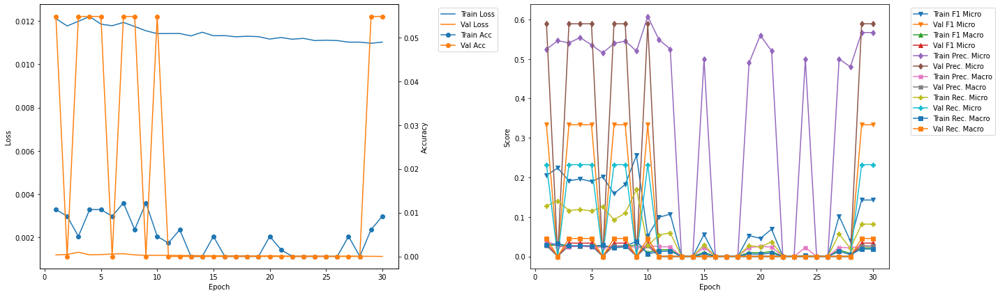

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 14.67
Train Loss: 0.0121 	Validation Loss: 0.0014
Train Accuracy: 0.0076 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0759 	Validation F1 Micro: 0.2491
Train F1 Marco: 0.0143 	Validation F1 Macro: 0.0289
Train Precision Mirco: 0.48 	Validation Precision Micro: 0.4658
Train Precision Marco: 0.0276 	Validation Precision Macro: 0.0212
Train Recall Mirco: 0.0412 	Validation Recall Micro: 0.17
Train Recall Marco: 0.0097 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 14.83
Train Loss: 0.0117 	Validation Loss: 0.0013
Train Accuracy: 0.0138 	Validation Accuracy: 0.0
Train F1 Mirco: 0.1677 	Validation F1 Micro: 0.2491
Train F1 Marco: 0.0235 	Validation F1 Macro: 0.0289
Train Precision Mirco: 0.5658 	Validation Precision Micro: 0.4658
Train Precision Marco: 0.0257 	Validation Precision Macro: 0.0212
Train Recall Mirco: 0.0985 	Valida

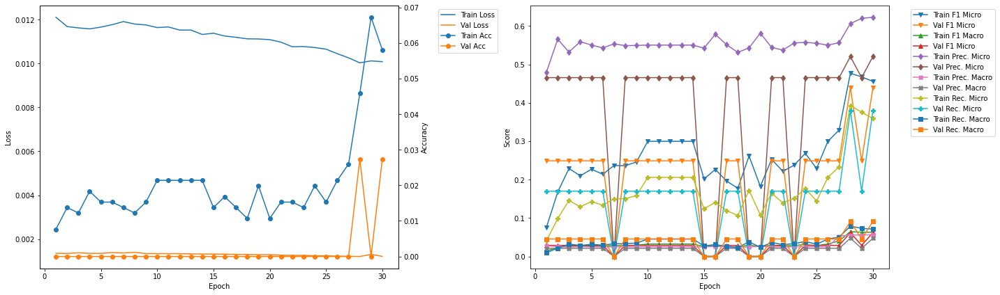

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 19.5
Train Loss: 0.0114 	Validation Loss: 0.0014
Train Accuracy: 0.0398 	Validation Accuracy: 0.0
Train F1 Mirco: 0.3196 	Validation F1 Micro: 0.2917
Train F1 Marco: 0.0583 	Validation F1 Macro: 0.0344
Train Precision Mirco: 0.4922 	Validation Precision Micro: 0.5676
Train Precision Marco: 0.0681 	Validation Precision Macro: 0.071
Train Recall Mirco: 0.2366 	Validation Recall Micro: 0.1963
Train Recall Marco: 0.0512 	Validation Recall Macro: 0.0463

Epoch 2 	Learning Rate: 0.01 	Time (min): 19.66
Train Loss: 0.0103 	Validation Loss: 0.0013
Train Accuracy: 0.0413 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.3922 	Validation F1 Micro: 0.3693
Train F1 Marco: 0.0609 	Validation F1 Macro: 0.0382
Train Precision Mirco: 0.5619 	Validation Precision Micro: 0.726
Train Precision Marco: 0.071 	Validation Precision Macro: 0.033
Train Recall Mirco: 0.3012 	Vali

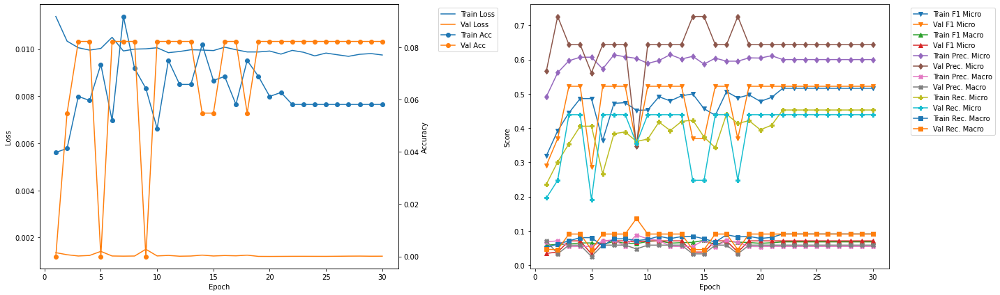

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 24.33
Train Loss: 0.0122 	Validation Loss: 0.0014
Train Accuracy: 0.0061 	Validation Accuracy: 0.0
Train F1 Mirco: 0.1396 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0276 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.4704 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0741 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0819 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0198 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 24.49
Train Loss: 0.0116 	Validation Loss: 0.0013
Train Accuracy: 0.0153 	Validation Accuracy: 0.0
Train F1 Mirco: 0.2265 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0281 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.5485 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0249 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.1427 	Validation Recall Micro: 0.0
Tra

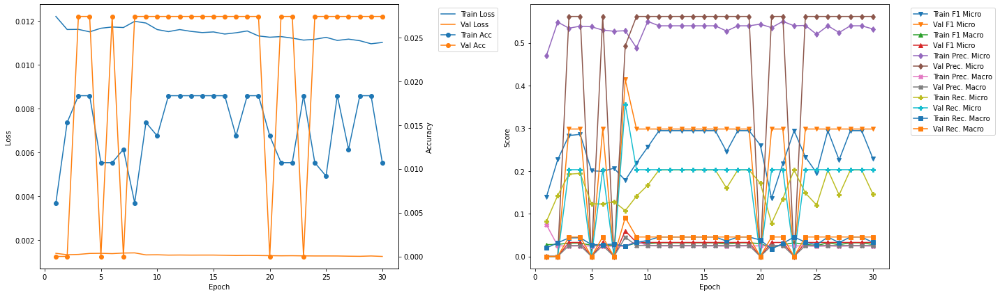

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 29.15
Train Loss: 0.0119 	Validation Loss: 0.0012
Train Accuracy: 0.0031 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.2181 	Validation F1 Micro: 0.272
Train F1 Marco: 0.0414 	Validation F1 Macro: 0.0289
Train Precision Mirco: 0.4921 	Validation Precision Micro: 0.4658
Train Precision Marco: 0.0887 	Validation Precision Macro: 0.0212
Train Recall Mirco: 0.1401 	Validation Recall Micro: 0.1921
Train Recall Marco: 0.0401 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 29.31
Train Loss: 0.0112 	Validation Loss: 0.0012
Train Accuracy: 0.0107 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.233 	Validation F1 Micro: 0.272
Train F1 Marco: 0.0284 	Validation F1 Macro: 0.0289
Train Precision Mirco: 0.547 	Validation Precision Micro: 0.4658
Train Precision Marco: 0.0249 	Validation Precision Macro: 0.0212
Train Recall Mirco: 0.148 	V

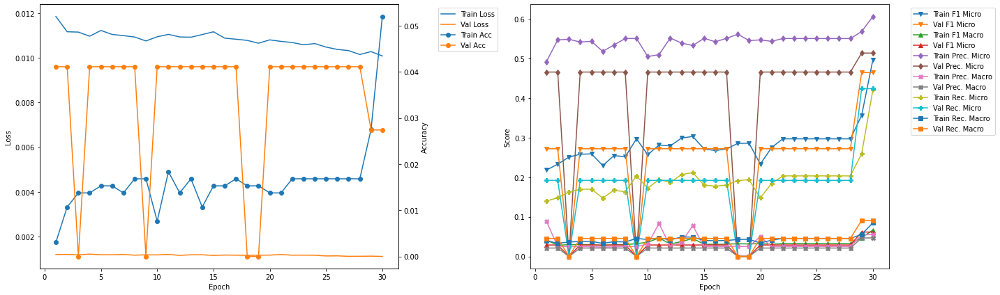

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 33.97
Train Loss: 0.0123 	Validation Loss: 0.0014
Train Accuracy: 0.0137 	Validation Accuracy: 0.0
Train F1 Mirco: 0.2424 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0337 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.5055 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0645 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.1594 	Validation Recall Micro: 0.0
Train Recall Marco: 0.036 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 34.13
Train Loss: 0.011 	Validation Loss: 0.0013
Train Accuracy: 0.0122 	Validation Accuracy: 0.0
Train F1 Mirco: 0.2511 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0343 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.5236 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0417 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.1651 	Validation Recall Micro: 0.0
Train

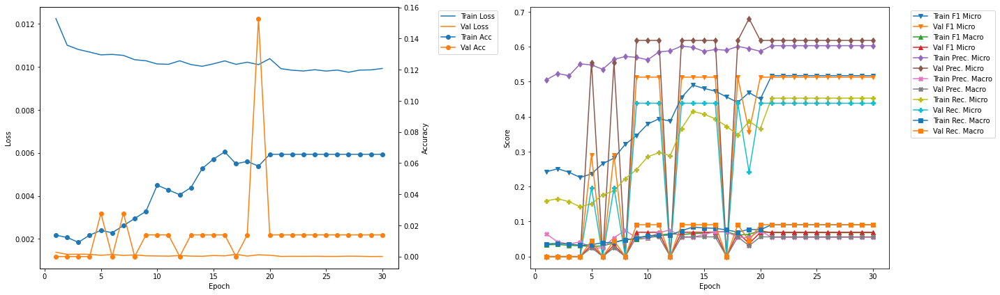

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 38.79
Train Loss: 0.0109 	Validation Loss: 0.0011
Train Accuracy: 0.0397 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.3824 	Validation F1 Micro: 0.3609
Train F1 Marco: 0.0602 	Validation F1 Macro: 0.0364
Train Precision Mirco: 0.5516 	Validation Precision Micro: 0.6667
Train Precision Marco: 0.0617 	Validation Precision Macro: 0.0303
Train Recall Mirco: 0.2926 	Validation Recall Micro: 0.2474
Train Recall Marco: 0.0623 	Validation Recall Macro: 0.0455

Validation F1 Micro Score Increased (0.522222 --> 0.562130).  Saving model ...

Epoch 2 	Learning Rate: 0.01 	Time (min): 38.96
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0489 	Validation Accuracy: 0.1111
Train F1 Mirco: 0.4571 	Validation F1 Micro: 0.5621
Train F1 Marco: 0.0734 	Validation F1 Macro: 0.0723
Train Precision Mirco: 0.5815 	Validation Precision Micro: 0.6597
Train Prec

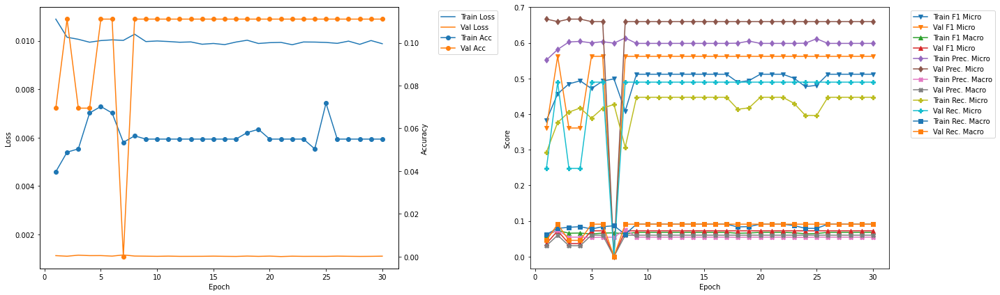

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 43.62
Train Loss: 0.0106 	Validation Loss: 0.001
Train Accuracy: 0.0687 	Validation Accuracy: 0.0972
Train F1 Mirco: 0.4646 	Validation F1 Micro: 0.5346
Train F1 Marco: 0.0774 	Validation F1 Macro: 0.0667
Train Precision Mirco: 0.5814 	Validation Precision Micro: 0.5903
Train Precision Marco: 0.0737 	Validation Precision Macro: 0.0537
Train Recall Mirco: 0.3869 	Validation Recall Micro: 0.4885
Train Recall Marco: 0.083 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 43.79
Train Loss: 0.0104 	Validation Loss: 0.001
Train Accuracy: 0.0504 	Validation Accuracy: 0.1528
Train F1 Mirco: 0.4781 	Validation F1 Micro: 0.4228
Train F1 Marco: 0.0701 	Validation F1 Macro: 0.0381
Train Precision Mirco: 0.5822 	Validation Precision Micro: 0.7222
Train Precision Marco: 0.0658 	Validation Precision Macro: 0.0328
Train Recall Mirco: 0.4055

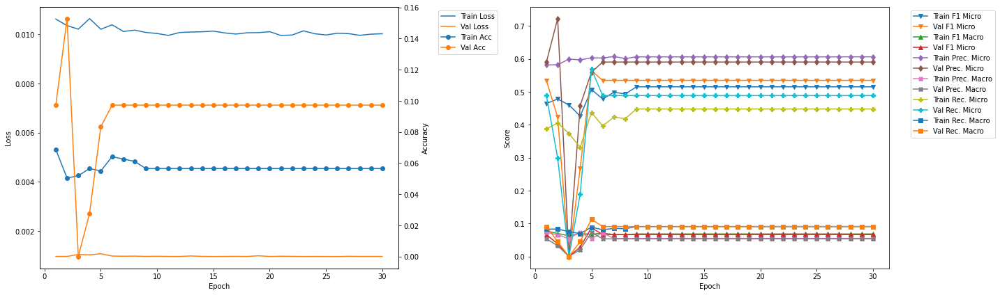

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 10 	Epoch: 5
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.055 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.5069 	Validation F1 Micro: 0.5641
Train F1 Marco: 0.0677 	Validation F1 Macro: 0.0872
Train Precision Mirco: 0.6031 	Validation Precision Micro: 0.5593
Train Precision Marco: 0.0549 	Validation Precision Macro: 0.0729
Train Recall Mirco: 0.4371 	Validation Recall Micro: 0.569
Train Recall Marco: 0.0889 	Validation Recall Macro: 0.1129


In [22]:
resnet101LSTM_700_1_0_best = Kfold_train_CNN_RNN(model = resnet101LSTM_700_1_0, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'resnet101LSTM_700_1_0')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.15
Train Loss: 0.0175 	Validation Loss: 0.0016
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0484 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0337 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1425 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0833 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0292 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0358 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.29
Train Loss: 0.0136 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	V

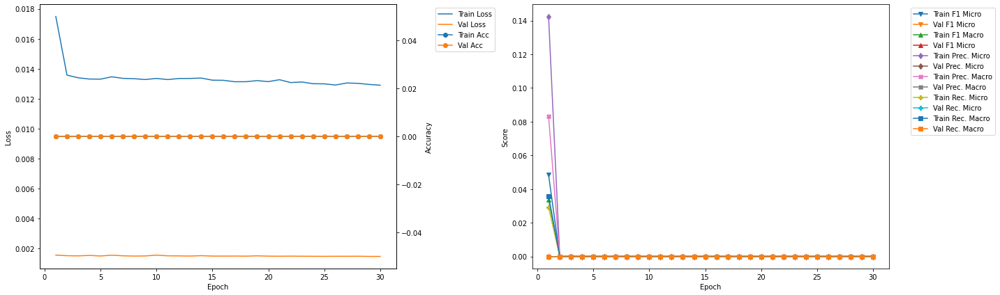

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 4.46
Train Loss: 0.0139 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 4.61
Train Loss: 0.0136 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall M

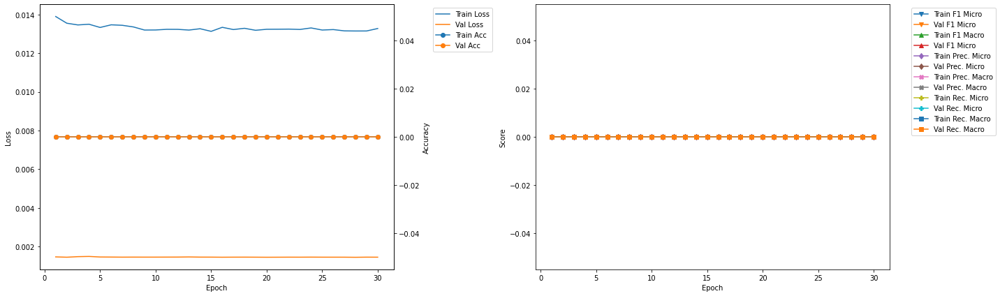

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 8.78
Train Loss: 0.0153 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0487 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0292 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1247 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0964 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0302 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0226 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 8.93
Train Loss: 0.0133 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	V

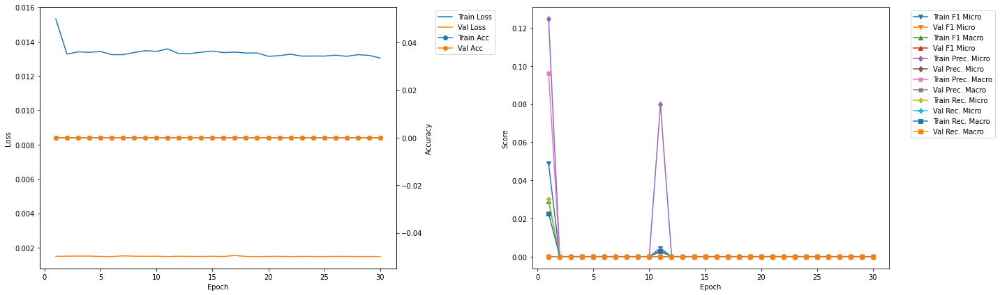

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 13.12
Train Loss: 0.0154 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0442 	Validation F1 Micro: 0.0
Train F1 Marco: 0.029 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1253 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0855 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0268 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0221 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 13.26
Train Loss: 0.0133 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	

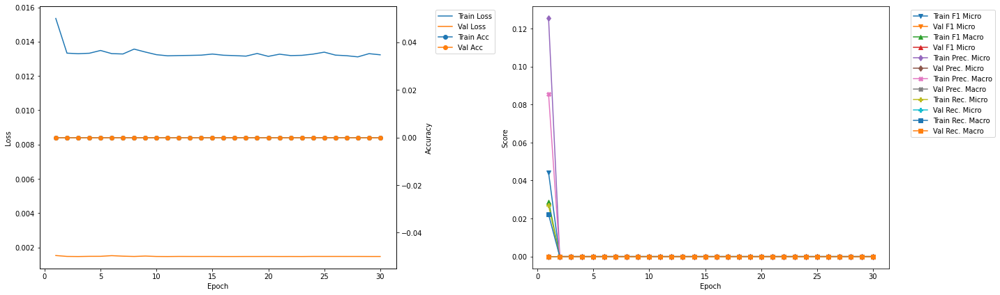

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 17.45
Train Loss: 0.0148 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0593 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0317 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.16 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1164 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0364 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0221 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 17.59
Train Loss: 0.0134 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	V

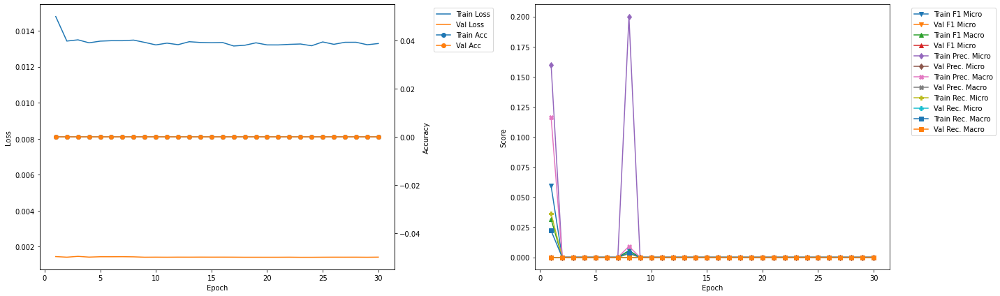

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 21.77
Train Loss: 0.014 	Validation Loss: 0.0016
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0034 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0032 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.12 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0055 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0017 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0022 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 21.92
Train Loss: 0.0134 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Va

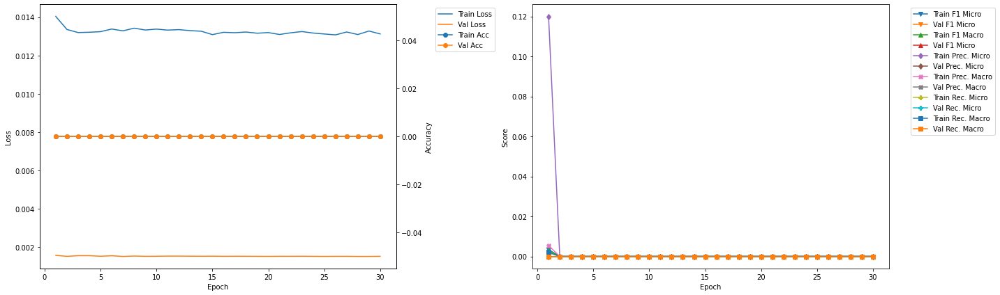

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 26.1
Train Loss: 0.0139 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 26.25
Train Loss: 0.0135 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall 

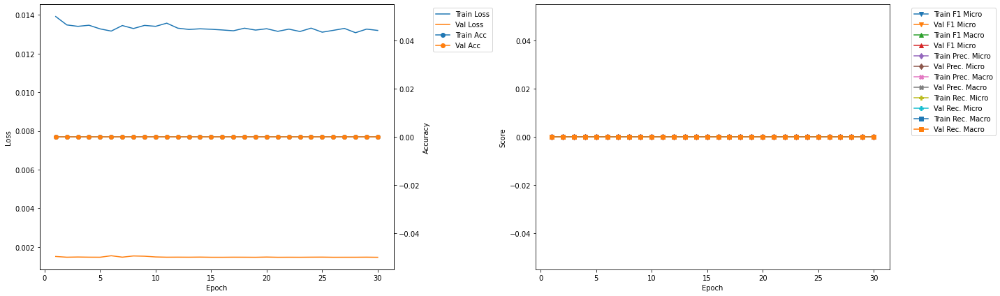

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 30.44
Train Loss: 0.014 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0034 	Validation F1 Micro: 0.0
Train F1 Marco: 0.003 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.12 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0055 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0017 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0021 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 30.59
Train Loss: 0.0133 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Val

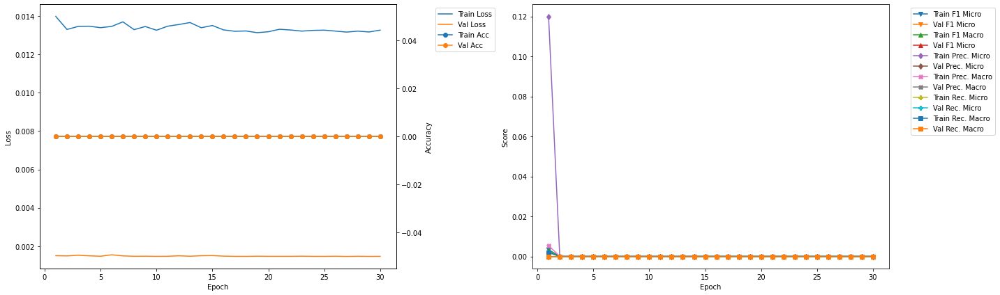

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 34.77
Train Loss: 0.0148 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.054 	Validation F1 Micro: 0.0
Train F1 Marco: 0.031 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.145 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1055 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0331 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0221 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 34.91
Train Loss: 0.0133 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Va

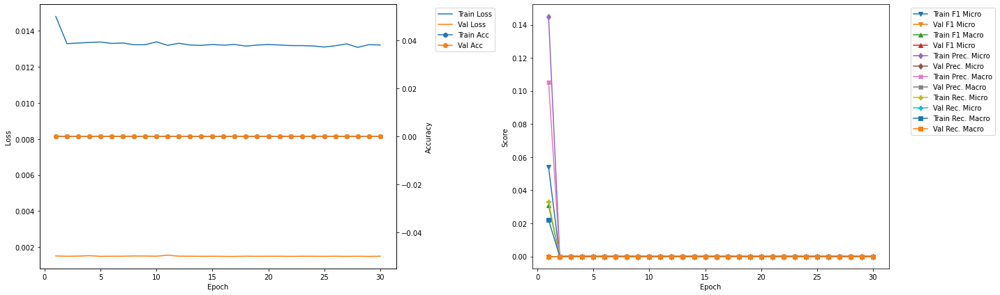

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 39.11
Train Loss: 0.0138 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0034 	Validation F1 Micro: 0.0
Train F1 Marco: 0.003 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.12 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0055 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0017 	Validation Recall Micro: 0.0
Train Recall Marco: 0.002 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 39.26
Train Loss: 0.0133 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Va

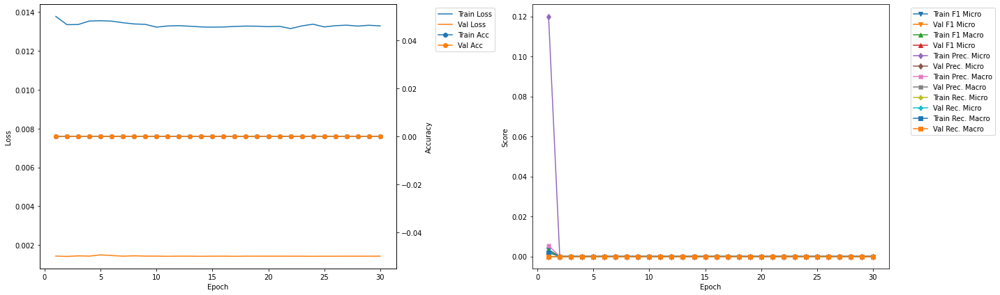

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 0 	Epoch: 0
Train Loss: 0 	Validation Loss: 0
Train Accuracy: 0 	Validation Accuracy: 0
Train F1 Mirco: 0 	Validation F1 Micro: 0
Train F1 Marco: 0 	Validation F1 Macro: 0
Train Precision Mirco: 0 	Validation Precision Micro: 0
Train Precision Marco: 0 	Validation Precision Macro: 0
Train Recall Mirco: 0 	Validation Recall Micro: 0
Train Recall Marco: 0 	Validation Recall Macro: 0


In [23]:
densenet121LSTM_700_1_0_best = Kfold_train_CNN_RNN(model = densenet121LSTM_700_1_0, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'densenet121LSTM_700_1_0')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.16
Train Loss: 0.0168 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0473 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0297 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1019 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0987 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0308 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0213 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.31
Train Loss: 0.0128 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0068 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0064 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.2609 	Validation Precision Micro: 0.0
Train Precision Marco: 0.2273 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0034 	Validation Recall Micro: 0.0
Train Recal

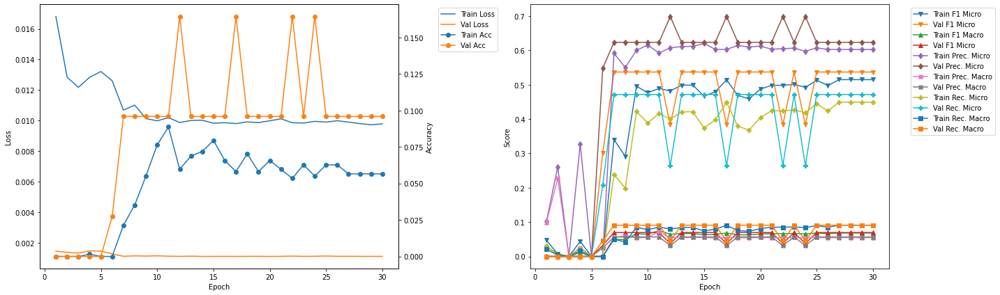

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 4.82
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0749 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4902 	Validation F1 Micro: 0.497
Train F1 Marco: 0.0655 	Validation F1 Macro: 0.0664
Train Precision Mirco: 0.6166 	Validation Precision Micro: 0.5753
Train Precision Marco: 0.0553 	Validation Precision Macro: 0.0523
Train Recall Mirco: 0.4068 	Validation Recall Micro: 0.4375
Train Recall Marco: 0.0805 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 4.97
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0841 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.5056 	Validation F1 Micro: 0.497
Train F1 Marco: 0.0793 	Validation F1 Macro: 0.0664
Train Precision Mirco: 0.5986 	Validation Precision Micro: 0.5753
Train Precision Marco: 0.0744 	Validation Precision Macro: 0.0523
Train Recall Mirco: 0.4376 	Vali

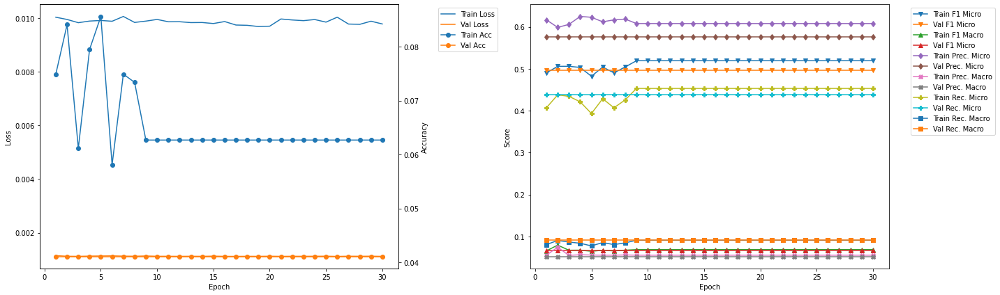

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 9.46
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.0795 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4867 	Validation F1 Micro: 0.3443
Train F1 Marco: 0.065 	Validation F1 Macro: 0.0356
Train Precision Mirco: 0.6118 	Validation Precision Micro: 0.6438
Train Precision Marco: 0.0548 	Validation Precision Macro: 0.0293
Train Recall Mirco: 0.4041 	Validation Recall Micro: 0.235
Train Recall Marco: 0.0799 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 9.61
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0765 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4915 	Validation F1 Micro: 0.3443
Train F1 Marco: 0.0655 	Validation F1 Macro: 0.0356
Train Precision Mirco: 0.6098 	Validation Precision Micro: 0.6438
Train Precision Marco: 0.0548 	Validation Precision Macro: 0.0293
Train Recall Mirco: 0.4116 	Va

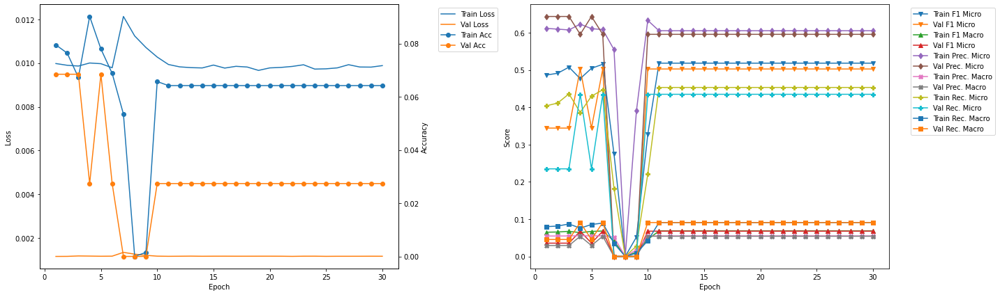

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 14.09
Train Loss: 0.0124 	Validation Loss: 0.0013
Train Accuracy: 0.0122 	Validation Accuracy: 0.0
Train F1 Mirco: 0.1255 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0356 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.3934 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0878 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0746 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0357 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 14.25
Train Loss: 0.0112 	Validation Loss: 0.0012
Train Accuracy: 0.0138 	Validation Accuracy: 0.0137
Train F1 Mirco: 0.1912 	Validation F1 Micro: 0.2943
Train F1 Marco: 0.0253 	Validation F1 Macro: 0.0317
Train Precision Mirco: 0.5383 	Validation Precision Micro: 0.5342
Train Precision Marco: 0.0245 	Validation Precision Macro: 0.0243
Train Recall Mirco: 0.1162 	Validation Recall

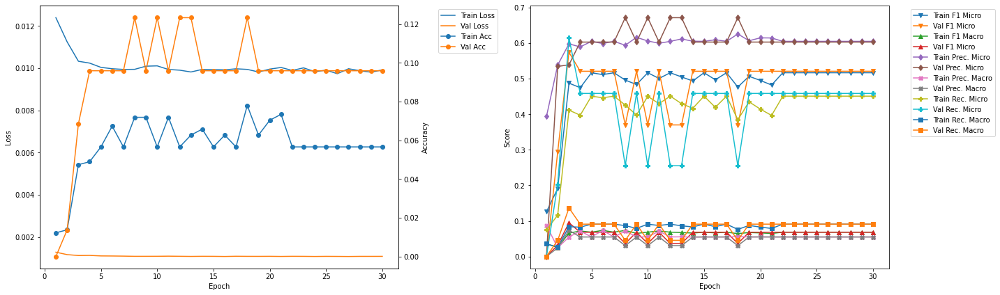

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 18.74
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0703 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4844 	Validation F1 Micro: 0.5181
Train F1 Marco: 0.0651 	Validation F1 Macro: 0.0669
Train Precision Mirco: 0.6027 	Validation Precision Micro: 0.589
Train Precision Marco: 0.0544 	Validation Precision Macro: 0.0535
Train Recall Mirco: 0.4049 	Validation Recall Micro: 0.4624
Train Recall Marco: 0.0812 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 18.89
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0627 	Validation Accuracy: 0.1507
Train F1 Mirco: 0.5072 	Validation F1 Micro: 0.3938
Train F1 Marco: 0.0701 	Validation F1 Macro: 0.0374
Train Precision Mirco: 0.6028 	Validation Precision Micro: 0.6986
Train Precision Marco: 0.0696 	Validation Precision Macro: 0.0318
Train Recall Mirco: 0.4378 

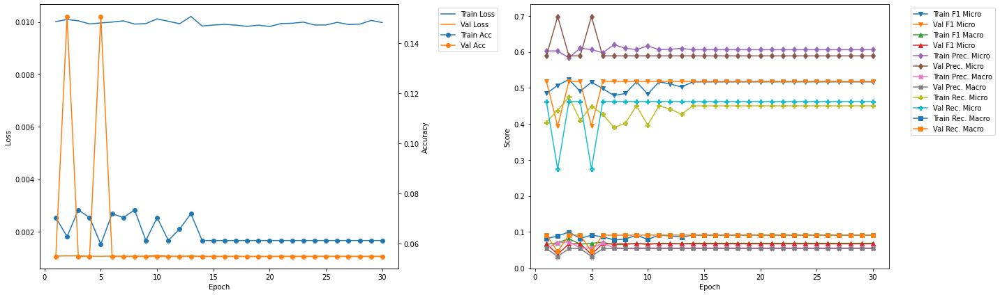

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 23.37
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0612 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4891 	Validation F1 Micro: 0.5714
Train F1 Marco: 0.0654 	Validation F1 Macro: 0.0745
Train Precision Mirco: 0.596 	Validation Precision Micro: 0.6986
Train Precision Marco: 0.0537 	Validation Precision Macro: 0.0635
Train Recall Mirco: 0.4147 	Validation Recall Micro: 0.4834
Train Recall Marco: 0.0835 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 23.53
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0887 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4691 	Validation F1 Micro: 0.5714
Train F1 Marco: 0.063 	Validation F1 Macro: 0.0745
Train Precision Mirco: 0.602 	Validation Precision Micro: 0.6986
Train Precision Marco: 0.0537 	Validation Precision Macro: 0.0635
Train Recall Mirco: 0.3842 	V

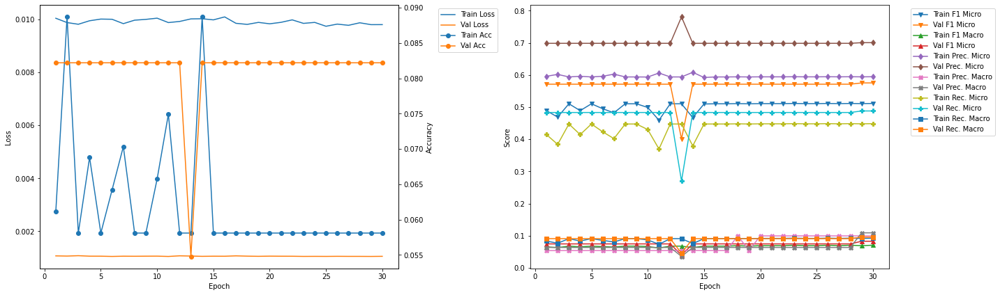

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 28.01
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0765 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.5014 	Validation F1 Micro: 0.4786
Train F1 Marco: 0.0679 	Validation F1 Macro: 0.0732
Train Precision Mirco: 0.6121 	Validation Precision Micro: 0.5714
Train Precision Marco: 0.1006 	Validation Precision Macro: 0.0971
Train Recall Mirco: 0.4246 	Validation Recall Micro: 0.4118
Train Recall Marco: 0.0844 	Validation Recall Macro: 0.095

Epoch 2 	Learning Rate: 0.01 	Time (min): 28.17
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0642 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.5223 	Validation F1 Micro: 0.4786
Train F1 Marco: 0.0701 	Validation F1 Macro: 0.0732
Train Precision Mirco: 0.6089 	Validation Precision Micro: 0.5714
Train Precision Marco: 0.1008 	Validation Precision Macro: 0.0971
Train Recall Mirco: 0.457

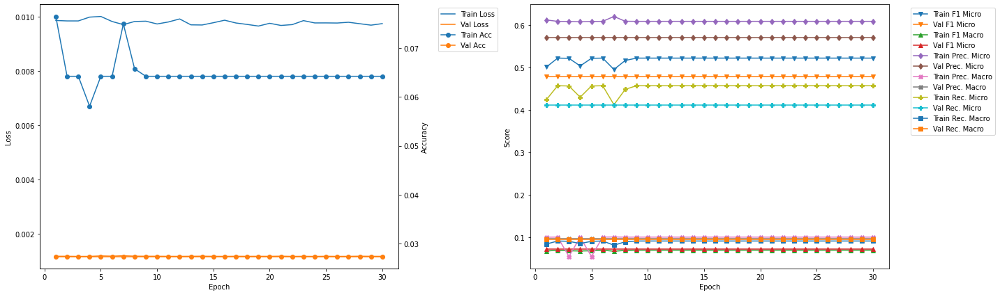

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 32.65
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.055 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.5013 	Validation F1 Micro: 0.5487
Train F1 Marco: 0.0667 	Validation F1 Macro: 0.0712
Train Precision Mirco: 0.5992 	Validation Precision Micro: 0.6458
Train Precision Marco: 0.0542 	Validation Precision Macro: 0.0587
Train Recall Mirco: 0.4309 	Validation Recall Micro: 0.4769
Train Recall Marco: 0.0869 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 32.81
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0626 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.5144 	Validation F1 Micro: 0.5471
Train F1 Marco: 0.0707 	Validation F1 Macro: 0.0712
Train Precision Mirco: 0.6006 	Validation Precision Micro: 0.6414
Train Precision Marco: 0.1 	Validation Precision Macro: 0.0587
Train Recall Mirco: 0.4498 	Valid

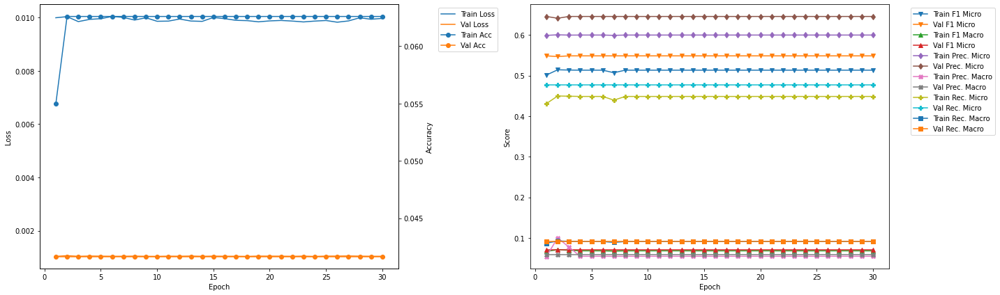

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 37.29
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.058 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.5182 	Validation F1 Micro: 0.5047
Train F1 Marco: 0.0686 	Validation F1 Macro: 0.0653
Train Precision Mirco: 0.6092 	Validation Precision Micro: 0.5625
Train Precision Marco: 0.0554 	Validation Precision Macro: 0.0511
Train Recall Mirco: 0.4508 	Validation Recall Micro: 0.4576
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 37.44
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.058 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.5182 	Validation F1 Micro: 0.5047
Train F1 Marco: 0.0686 	Validation F1 Macro: 0.0653
Train Precision Mirco: 0.6092 	Validation Precision Micro: 0.5625
Train Precision Marco: 0.0554 	Validation Precision Macro: 0.0511
Train Recall Mirco: 0.4508

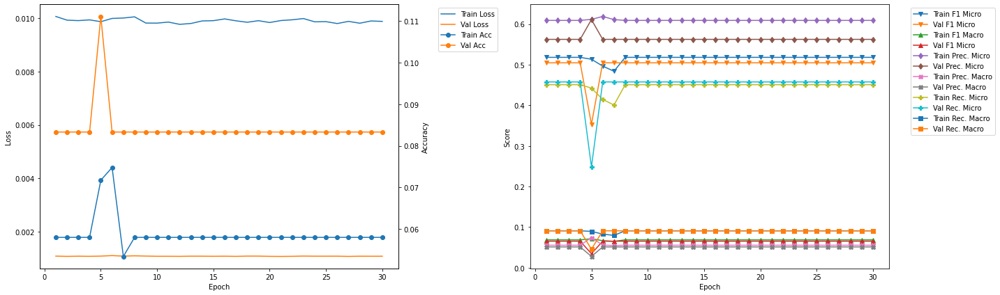

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 41.93
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0626 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.5083 	Validation F1 Micro: 0.4927
Train F1 Marco: 0.0673 	Validation F1 Macro: 0.0668
Train Precision Mirco: 0.6071 	Validation Precision Micro: 0.5833
Train Precision Marco: 0.055 	Validation Precision Macro: 0.053
Train Recall Mirco: 0.4371 	Validation Recall Micro: 0.4264
Train Recall Marco: 0.0871 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 42.08
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0794 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.4914 	Validation F1 Micro: 0.4927
Train F1 Marco: 0.0656 	Validation F1 Macro: 0.0668
Train Precision Mirco: 0.6164 	Validation Precision Micro: 0.5833
Train Precision Marco: 0.0553 	Validation Precision Macro: 0.053
Train Recall Mirco: 0.4086

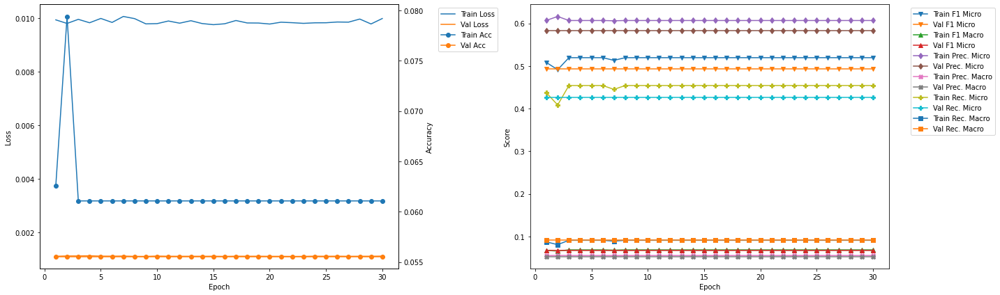

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 6 	Epoch: 29
Train Loss: 0.0098 	Validation Loss: 0.001
Train Accuracy: 0.0581 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.511 	Validation F1 Micro: 0.5754
Train F1 Marco: 0.069 	Validation F1 Macro: 0.0828
Train Precision Mirco: 0.5943 	Validation Precision Micro: 0.7007
Train Precision Marco: 0.0995 	Validation Precision Macro: 0.109
Train Recall Mirco: 0.4482 	Validation Recall Micro: 0.4882
Train Recall Marco: 0.0916 	Validation Recall Macro: 0.0955


In [24]:
densenet169LSTM_700_1_0_best = Kfold_train_CNN_RNN(model = densenet169LSTM_700_1_0, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'densenet169LSTM_700_1_0')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.17
Train Loss: 0.0172 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.061 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0399 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1329 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0832 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0396 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0353 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.33
Train Loss: 0.0132 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Va

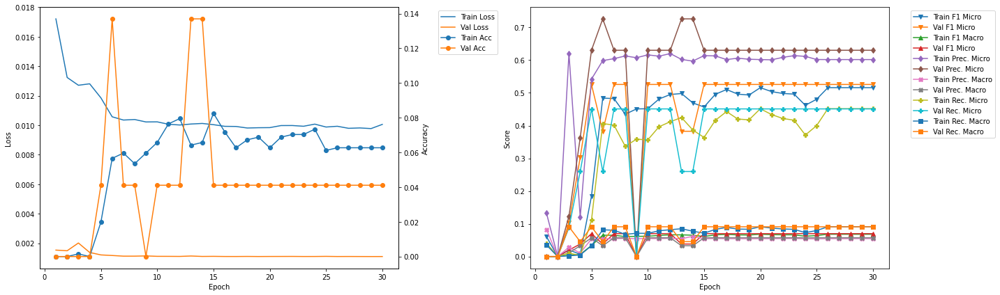

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 5.12
Train Loss: 0.0105 	Validation Loss: 0.0011
Train Accuracy: 0.055 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4466 	Validation F1 Micro: 0.4939
Train F1 Marco: 0.0684 	Validation F1 Macro: 0.0649
Train Precision Mirco: 0.5842 	Validation Precision Micro: 0.5548
Train Precision Marco: 0.0642 	Validation Precision Macro: 0.0504
Train Recall Mirco: 0.3615 	Validation Recall Micro: 0.4451
Train Recall Marco: 0.0767 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 5.28
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.0673 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4913 	Validation F1 Micro: 0.4939
Train F1 Marco: 0.0658 	Validation F1 Macro: 0.0649
Train Precision Mirco: 0.62 	Validation Precision Micro: 0.5548
Train Precision Marco: 0.0555 	Validation Precision Macro: 0.0504
Train Recall Mirco: 0.4068 	Val

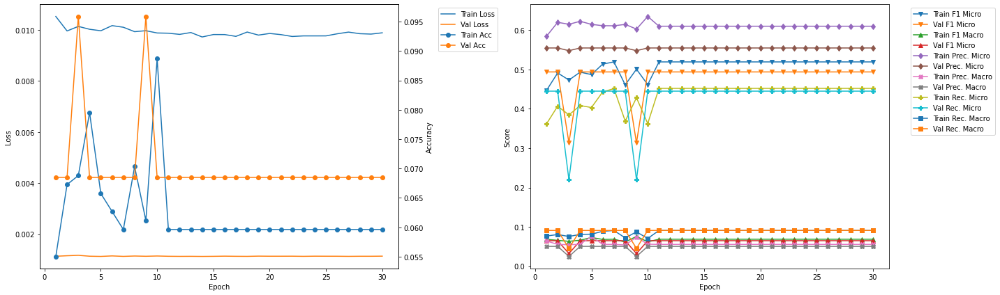

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 10.05
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.078 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.47 	Validation F1 Micro: 0.5145
Train F1 Marco: 0.063 	Validation F1 Macro: 0.0684
Train Precision Mirco: 0.614 	Validation Precision Micro: 0.6096
Train Precision Marco: 0.0547 	Validation Precision Macro: 0.0554
Train Recall Mirco: 0.3807 	Validation Recall Micro: 0.445
Train Recall Marco: 0.075 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 10.22
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0688 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4975 	Validation F1 Micro: 0.5145
Train F1 Marco: 0.0663 	Validation F1 Macro: 0.0684
Train Precision Mirco: 0.6084 	Validation Precision Micro: 0.6096
Train Precision Marco: 0.0549 	Validation Precision Macro: 0.0554
Train Recall Mirco: 0.4207 	Valid

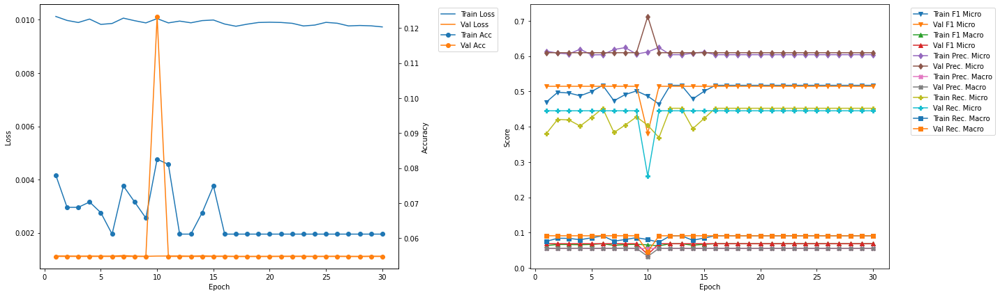

-------------------------------------------
FOLD 4
-------------------------------------------
Validation F1 Micro Score Increased (0.525714 --> 0.552326).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 15.01
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0596 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4904 	Validation F1 Micro: 0.5523
Train F1 Marco: 0.0655 	Validation F1 Macro: 0.0716
Train Precision Mirco: 0.6002 	Validation Precision Micro: 0.6507
Train Precision Marco: 0.054 	Validation Precision Macro: 0.0592
Train Recall Mirco: 0.4145 	Validation Recall Micro: 0.4798
Train Recall Marco: 0.0832 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 15.18
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0688 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4932 	Validation F1 Micro: 0.5523
Train F1 Marco: 0.0662 	Validation F1 Macro: 0.0716
Train Precision Mirco: 0.6112 	Validation Precision Micro: 0.6507
Train Preci

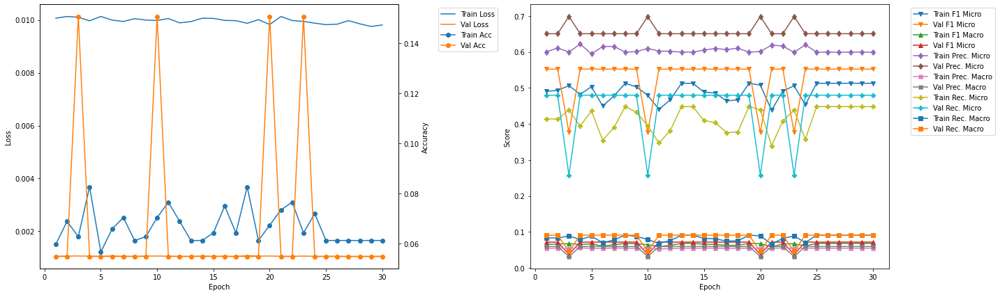

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 19.96
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.078 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4729 	Validation F1 Micro: 0.5325
Train F1 Marco: 0.0637 	Validation F1 Macro: 0.0691
Train Precision Mirco: 0.6196 	Validation Precision Micro: 0.6164
Train Precision Marco: 0.0552 	Validation Precision Macro: 0.056
Train Recall Mirco: 0.3823 	Validation Recall Micro: 0.4688
Train Recall Marco: 0.0758 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 20.12
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0596 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.5152 	Validation F1 Micro: 0.5325
Train F1 Marco: 0.0682 	Validation F1 Macro: 0.0691
Train Precision Mirco: 0.6032 	Validation Precision Micro: 0.6164
Train Precision Marco: 0.0548 	Validation Precision Macro: 0.056
Train Recall Mirco: 0.4496 	Val

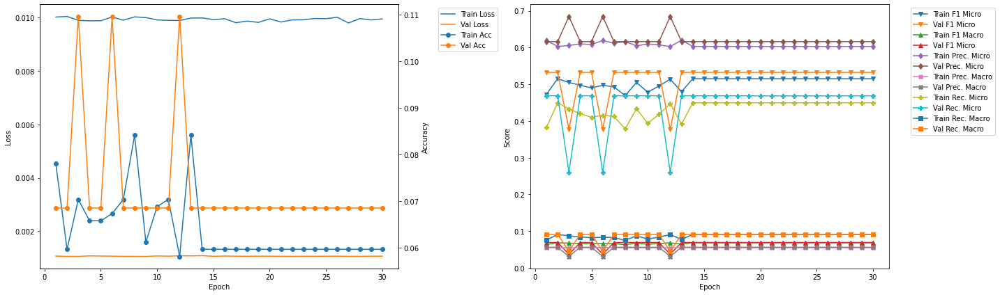

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 24.9
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0765 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.4685 	Validation F1 Micro: 0.3475
Train F1 Marco: 0.0626 	Validation F1 Macro: 0.0365
Train Precision Mirco: 0.6205 	Validation Precision Micro: 0.6712
Train Precision Marco: 0.0551 	Validation Precision Macro: 0.0305
Train Recall Mirco: 0.3763 	Validation Recall Micro: 0.2344
Train Recall Marco: 0.0734 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 25.07
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0719 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.512 	Validation F1 Micro: 0.5014
Train F1 Marco: 0.0678 	Validation F1 Macro: 0.0687
Train Precision Mirco: 0.6097 	Validation Precision Micro: 0.6096
Train Precision Marco: 0.0552 	Validation Precision Macro: 0.0554
Train Recall Mirco: 0.4413

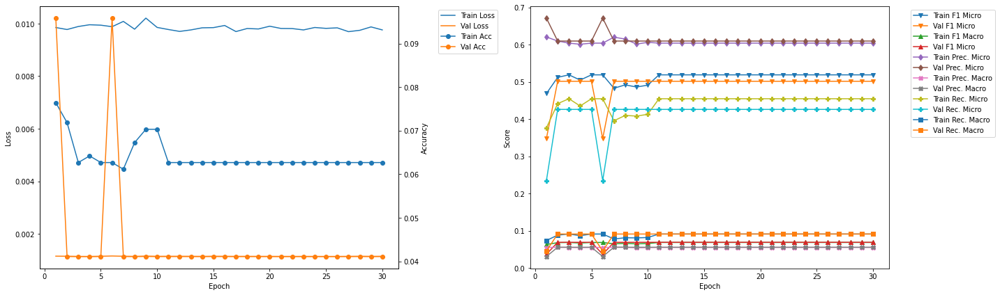

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 29.84
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0795 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4772 	Validation F1 Micro: 0.3778
Train F1 Marco: 0.0641 	Validation F1 Macro: 0.0374
Train Precision Mirco: 0.6085 	Validation Precision Micro: 0.6986
Train Precision Marco: 0.0544 	Validation Precision Macro: 0.0318
Train Recall Mirco: 0.3926 	Validation Recall Micro: 0.2589
Train Recall Marco: 0.0781 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 30.01
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0902 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4828 	Validation F1 Micro: 0.3778
Train F1 Marco: 0.0652 	Validation F1 Macro: 0.0374
Train Precision Mirco: 0.6241 	Validation Precision Micro: 0.6986
Train Precision Marco: 0.0559 	Validation Precision Macro: 0.0318
Train Recall Mirco: 0.3937

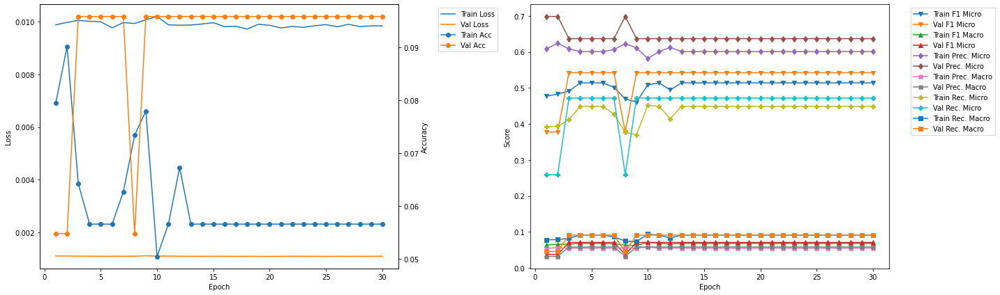

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 34.78
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0702 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.5023 	Validation F1 Micro: 0.5181
Train F1 Marco: 0.067 	Validation F1 Macro: 0.0674
Train Precision Mirco: 0.6089 	Validation Precision Micro: 0.5972
Train Precision Marco: 0.055 	Validation Precision Macro: 0.0543
Train Recall Mirco: 0.4275 	Validation Recall Micro: 0.4574
Train Recall Marco: 0.0857 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 34.95
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0672 	Validation Accuracy: 0.125
Train F1 Mirco: 0.514 	Validation F1 Micro: 0.3923
Train F1 Marco: 0.0683 	Validation F1 Macro: 0.0377
Train Precision Mirco: 0.6102 	Validation Precision Micro: 0.7083
Train Precision Marco: 0.0554 	Validation Precision Macro: 0.0322
Train Recall Mirco: 0.444 	Val

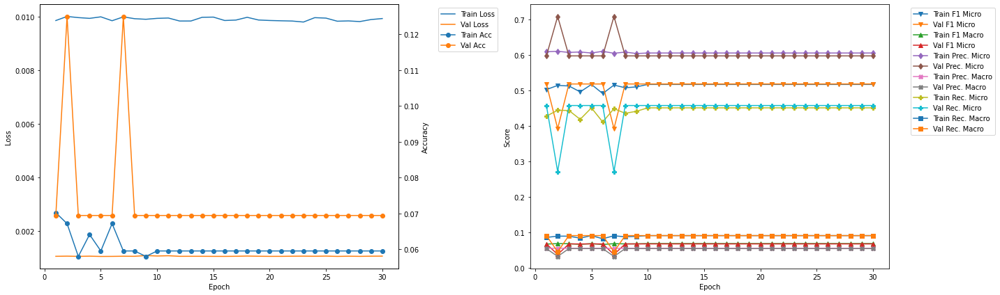

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 39.73
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.058 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.5078 	Validation F1 Micro: 0.5029
Train F1 Marco: 0.0673 	Validation F1 Macro: 0.0678
Train Precision Mirco: 0.6063 	Validation Precision Micro: 0.5972
Train Precision Marco: 0.0549 	Validation Precision Macro: 0.0543
Train Recall Mirco: 0.4368 	Validation Recall Micro: 0.4343
Train Recall Marco: 0.0872 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 39.89
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0794 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.4799 	Validation F1 Micro: 0.5029
Train F1 Marco: 0.0645 	Validation F1 Macro: 0.0678
Train Precision Mirco: 0.6267 	Validation Precision Micro: 0.5972
Train Precision Marco: 0.056 	Validation Precision Macro: 0.0543
Train Recall Mirco: 0.3888

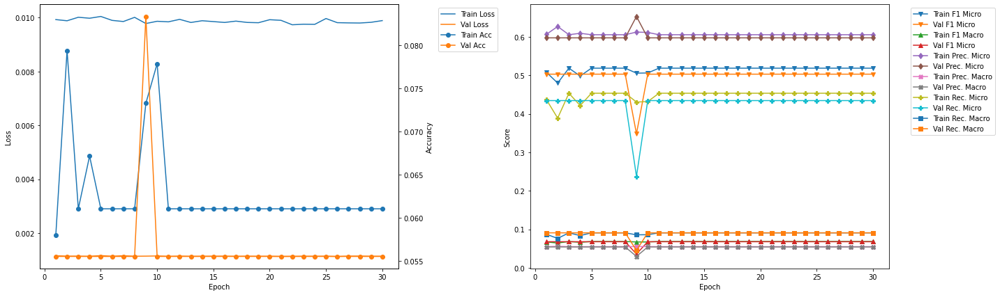

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 44.66
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0733 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.503 	Validation F1 Micro: 0.483
Train F1 Marco: 0.0671 	Validation F1 Macro: 0.0638
Train Precision Mirco: 0.619 	Validation Precision Micro: 0.5417
Train Precision Marco: 0.0558 	Validation Precision Macro: 0.0492
Train Recall Mirco: 0.4236 	Validation Recall Micro: 0.4358
Train Recall Marco: 0.0843 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 44.83
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0611 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.5205 	Validation F1 Micro: 0.483
Train F1 Marco: 0.0688 	Validation F1 Macro: 0.0638
Train Precision Mirco: 0.6115 	Validation Precision Micro: 0.5417
Train Precision Marco: 0.0556 	Validation Precision Macro: 0.0492
Train Recall Mirco: 0.4531 	V

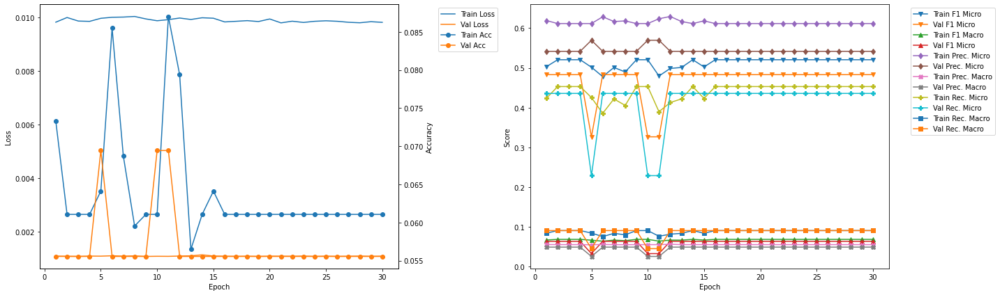

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 4 	Epoch: 1
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0596 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4904 	Validation F1 Micro: 0.5523
Train F1 Marco: 0.0655 	Validation F1 Macro: 0.0716
Train Precision Mirco: 0.6002 	Validation Precision Micro: 0.6507
Train Precision Marco: 0.054 	Validation Precision Macro: 0.0592
Train Recall Mirco: 0.4145 	Validation Recall Micro: 0.4798
Train Recall Marco: 0.0832 	Validation Recall Macro: 0.0909


In [25]:
densenet201LSTM_700_1_0_best = Kfold_train_CNN_RNN(model = densenet201LSTM_700_1_0, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'densenet201LSTM_700_1_0')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.19
Train Loss: 0.017 	Validation Loss: 0.0014
Train Accuracy: 0.0015 	Validation Accuracy: 0.0
Train F1 Mirco: 0.1124 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0439 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.2144 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1047 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0762 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0367 	Validation Recall Macro: 0.0

Validation F1 Micro Score Increased (0.000000 --> 0.479042).  Saving model ...

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.4
Train Loss: 0.0115 	Validation Loss: 0.0012
Train Accuracy: 0.0321 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.2051 	Validation F1 Micro: 0.479
Train F1 Marco: 0.0341 	Validation F1 Macro: 0.0641
Train Precision Mirco: 0.6078 	Validation Precision Micro: 0.5479
Train Precision Marco: 0.0554 	Valid

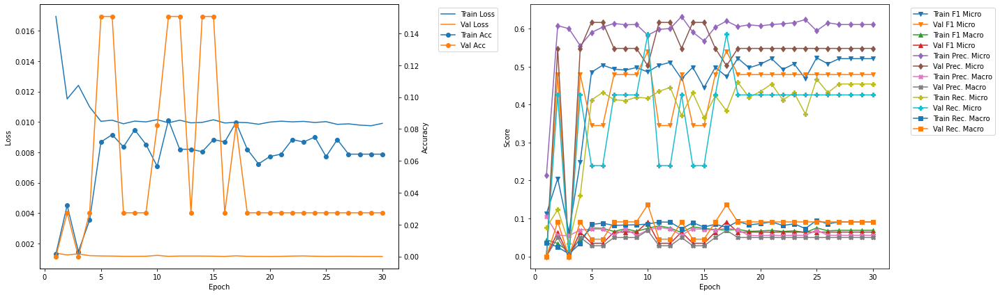

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 5.98
Train Loss: 0.0106 	Validation Loss: 0.0011
Train Accuracy: 0.0489 	Validation Accuracy: 0.1096
Train F1 Mirco: 0.459 	Validation F1 Micro: 0.503
Train F1 Marco: 0.0692 	Validation F1 Macro: 0.0664
Train Precision Mirco: 0.593 	Validation Precision Micro: 0.5822
Train Precision Marco: 0.0698 	Validation Precision Macro: 0.0529
Train Recall Mirco: 0.3744 	Validation Recall Micro: 0.4427
Train Recall Marco: 0.0763 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 6.16
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0581 	Validation Accuracy: 0.1096
Train F1 Mirco: 0.4915 	Validation F1 Micro: 0.503
Train F1 Marco: 0.0657 	Validation F1 Macro: 0.0664
Train Precision Mirco: 0.6103 	Validation Precision Micro: 0.5822
Train Precision Marco: 0.0549 	Validation Precision Macro: 0.0529
Train Recall Mirco: 0.4114 	Va

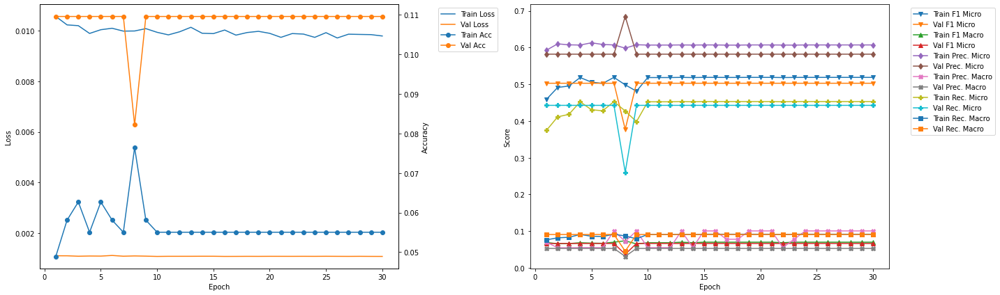

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 11.64
Train Loss: 0.0101 	Validation Loss: 0.0012
Train Accuracy: 0.0795 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4851 	Validation F1 Micro: 0.4795
Train F1 Marco: 0.0733 	Validation F1 Macro: 0.0651
Train Precision Mirco: 0.6167 	Validation Precision Micro: 0.5616
Train Precision Marco: 0.1181 	Validation Precision Macro: 0.0511
Train Recall Mirco: 0.3998 	Validation Recall Micro: 0.4184
Train Recall Marco: 0.0808 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 11.83
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0596 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.5216 	Validation F1 Micro: 0.4795
Train F1 Marco: 0.0701 	Validation F1 Macro: 0.0651
Train Precision Mirco: 0.6096 	Validation Precision Micro: 0.5616
Train Precision Marco: 0.1008 	Validation Precision Macro: 0.0511
Train Recall Mirco: 0.45

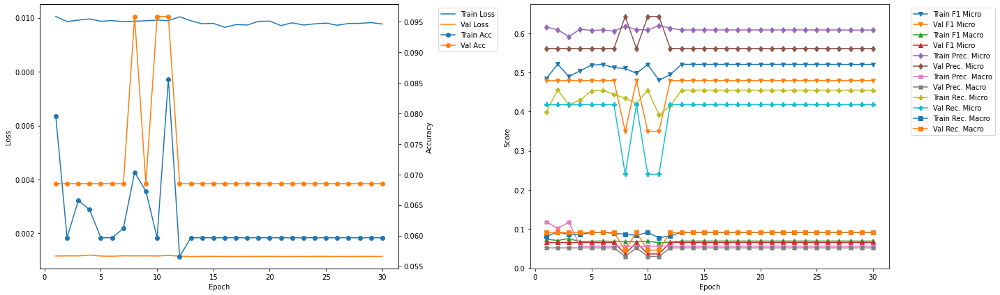

-------------------------------------------
FOLD 4
-------------------------------------------
Validation F1 Micro Score Increased (0.540541 --> 0.557471).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 17.38
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0673 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4955 	Validation F1 Micro: 0.5575
Train F1 Marco: 0.0702 	Validation F1 Macro: 0.0724
Train Precision Mirco: 0.5914 	Validation Precision Micro: 0.6644
Train Precision Marco: 0.0664 	Validation Precision Macro: 0.0604
Train Recall Mirco: 0.4264 	Validation Recall Micro: 0.4802
Train Recall Marco: 0.0866 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 17.57
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0841 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4864 	Validation F1 Micro: 0.5575
Train F1 Marco: 0.0654 	Validation F1 Macro: 0.0724
Train Precision Mirco: 0.6097 	Validation Precision Micro: 0.6644
Train Precisio

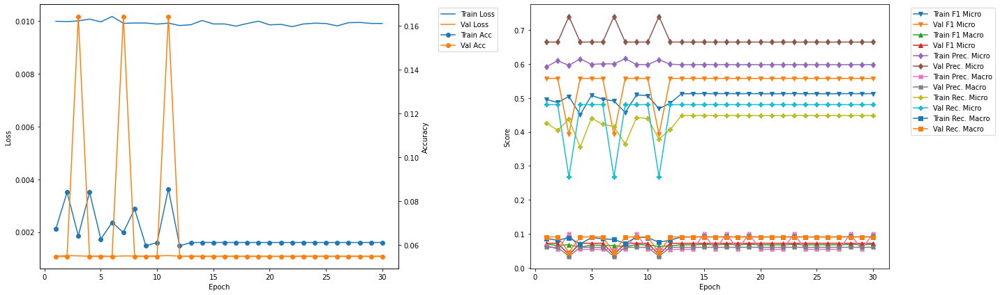

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 23.04
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0734 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4935 	Validation F1 Micro: 0.5321
Train F1 Marco: 0.0706 	Validation F1 Macro: 0.0673
Train Precision Mirco: 0.6002 	Validation Precision Micro: 0.5959
Train Precision Marco: 0.0688 	Validation Precision Macro: 0.0542
Train Recall Mirco: 0.419 	Validation Recall Micro: 0.4807
Train Recall Marco: 0.0851 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 23.23
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0612 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.5153 	Validation F1 Micro: 0.5321
Train F1 Marco: 0.0684 	Validation F1 Macro: 0.0673
Train Precision Mirco: 0.6055 	Validation Precision Micro: 0.5959
Train Precision Marco: 0.055 	Validation Precision Macro: 0.0542
Train Recall Mirco: 0.4485 	Vali

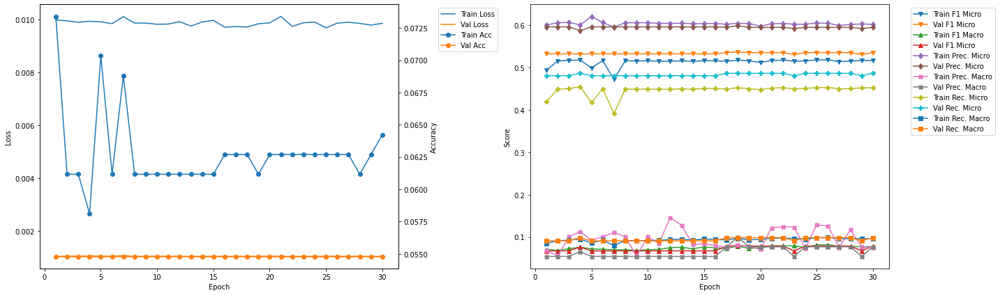

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 28.71
Train Loss: 0.0109 	Validation Loss: 0.0011
Train Accuracy: 0.055 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.3746 	Validation F1 Micro: 0.5179
Train F1 Marco: 0.0591 	Validation F1 Macro: 0.0895
Train Precision Mirco: 0.5867 	Validation Precision Micro: 0.5878
Train Precision Marco: 0.1098 	Validation Precision Macro: 0.0984
Train Recall Mirco: 0.2752 	Validation Recall Micro: 0.4628
Train Recall Marco: 0.0568 	Validation Recall Macro: 0.1061

Epoch 2 	Learning Rate: 0.01 	Time (min): 28.9
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0627 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.5183 	Validation F1 Micro: 0.5179
Train F1 Marco: 0.0699 	Validation F1 Macro: 0.0895
Train Precision Mirco: 0.6073 	Validation Precision Micro: 0.5878
Train Precision Marco: 0.1006 	Validation Precision Macro: 0.0984
Train Recall Mirco: 0.452 

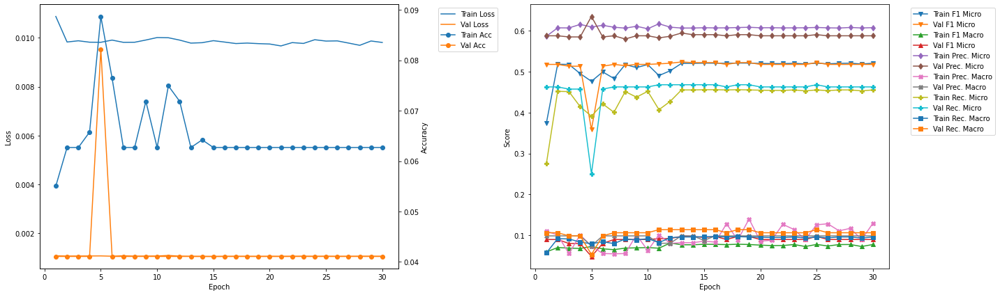

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 34.37
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0627 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4864 	Validation F1 Micro: 0.546
Train F1 Marco: 0.0757 	Validation F1 Macro: 0.0716
Train Precision Mirco: 0.6114 	Validation Precision Micro: 0.6463
Train Precision Marco: 0.0802 	Validation Precision Macro: 0.0592
Train Recall Mirco: 0.4038 	Validation Recall Micro: 0.4726
Train Recall Marco: 0.0862 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 34.56
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0749 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4947 	Validation F1 Micro: 0.5476
Train F1 Marco: 0.0775 	Validation F1 Macro: 0.0716
Train Precision Mirco: 0.6155 	Validation Precision Micro: 0.6507
Train Precision Marco: 0.1094 	Validation Precision Macro: 0.0592
Train Recall Mirco: 0.413

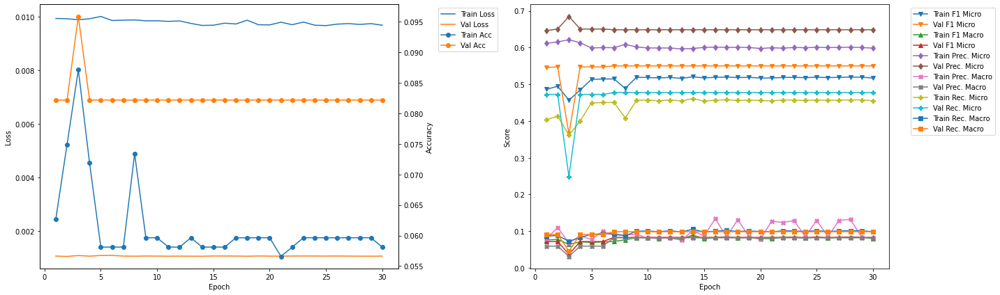

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 40.04
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0733 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.51 	Validation F1 Micro: 0.5131
Train F1 Marco: 0.0782 	Validation F1 Macro: 0.0869
Train Precision Mirco: 0.6125 	Validation Precision Micro: 0.5986
Train Precision Marco: 0.0845 	Validation Precision Macro: 0.0991
Train Recall Mirco: 0.4369 	Validation Recall Micro: 0.449
Train Recall Marco: 0.0927 	Validation Recall Macro: 0.1033

Epoch 2 	Learning Rate: 0.01 	Time (min): 40.23
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0641 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.5156 	Validation F1 Micro: 0.5044
Train F1 Marco: 0.0735 	Validation F1 Macro: 0.075
Train Precision Mirco: 0.6078 	Validation Precision Micro: 0.5931
Train Precision Marco: 0.0914 	Validation Precision Macro: 0.0991
Train Recall Mirco: 0.4477 	

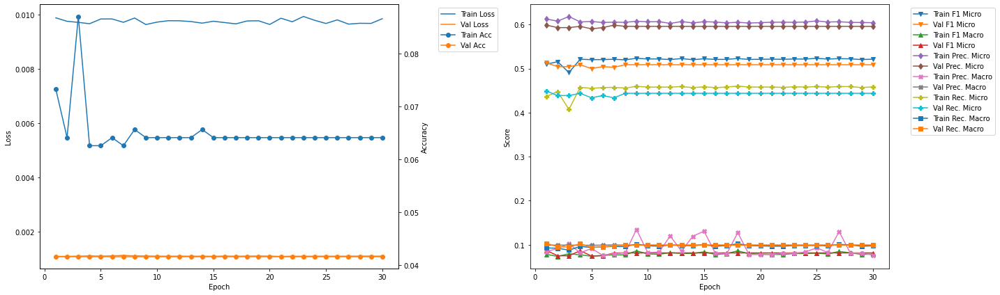

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 45.7
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0626 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.5056 	Validation F1 Micro: 0.3857
Train F1 Marco: 0.0806 	Validation F1 Macro: 0.0629
Train Precision Mirco: 0.5984 	Validation Precision Micro: 0.7105
Train Precision Marco: 0.0823 	Validation Precision Macro: 0.108
Train Recall Mirco: 0.4378 	Validation Recall Micro: 0.2647
Train Recall Marco: 0.0959 	Validation Recall Macro: 0.0612

Epoch 2 	Learning Rate: 0.01 	Time (min): 45.89
Train Loss: 0.0097 	Validation Loss: 0.0011
Train Accuracy: 0.0595 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.4953 	Validation F1 Micro: 0.5476
Train F1 Marco: 0.0725 	Validation F1 Macro: 0.0811
Train Precision Mirco: 0.5933 	Validation Precision Micro: 0.6643
Train Precision Marco: 0.0683 	Validation Precision Macro: 0.1056
Train Recall Mirco: 0.4251 	

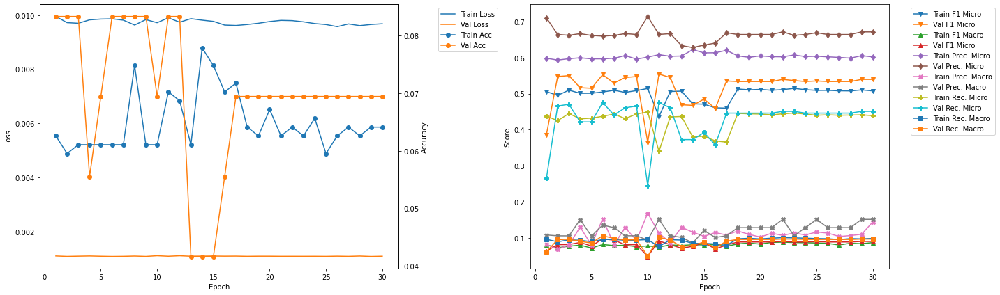

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 51.37
Train Loss: 0.0099 	Validation Loss: 0.001
Train Accuracy: 0.0733 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.5047 	Validation F1 Micro: 0.5235
Train F1 Marco: 0.0753 	Validation F1 Macro: 0.1031
Train Precision Mirco: 0.6116 	Validation Precision Micro: 0.6312
Train Precision Marco: 0.0841 	Validation Precision Macro: 0.1016
Train Recall Mirco: 0.4296 	Validation Recall Micro: 0.4472
Train Recall Marco: 0.0898 	Validation Recall Macro: 0.1151

Epoch 2 	Learning Rate: 0.01 	Time (min): 51.56
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0763 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.4724 	Validation F1 Micro: 0.5248
Train F1 Marco: 0.0731 	Validation F1 Macro: 0.1008
Train Precision Mirco: 0.6126 	Validation Precision Micro: 0.625
Train Precision Marco: 0.0836 	Validation Precision Macro: 0.0938
Train Recall Mirco: 0.3844 

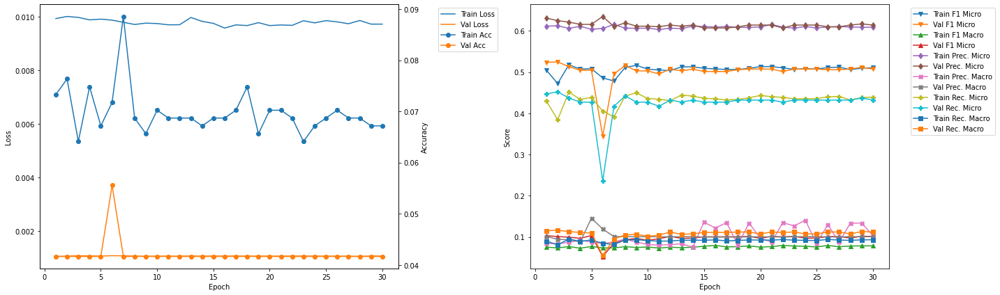

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 4 	Epoch: 1
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0673 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4955 	Validation F1 Micro: 0.5575
Train F1 Marco: 0.0702 	Validation F1 Macro: 0.0724
Train Precision Mirco: 0.5914 	Validation Precision Micro: 0.6644
Train Precision Marco: 0.0664 	Validation Precision Macro: 0.0604
Train Recall Mirco: 0.4264 	Validation Recall Micro: 0.4802
Train Recall Marco: 0.0866 	Validation Recall Macro: 0.0909


In [26]:
vgg11bnLSTM_700_1_0_best = Kfold_train_CNN_RNN(model = vgg11bnLSTM_700_1_0, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'vgg11bnLSTM_700_1_0')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.2
Train Loss: 0.0254 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0604 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0452 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1506 	Validation Precision Micro: 0.0
Train Precision Marco: 0.14 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0378 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0327 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.41
Train Loss: 0.0136 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Vali

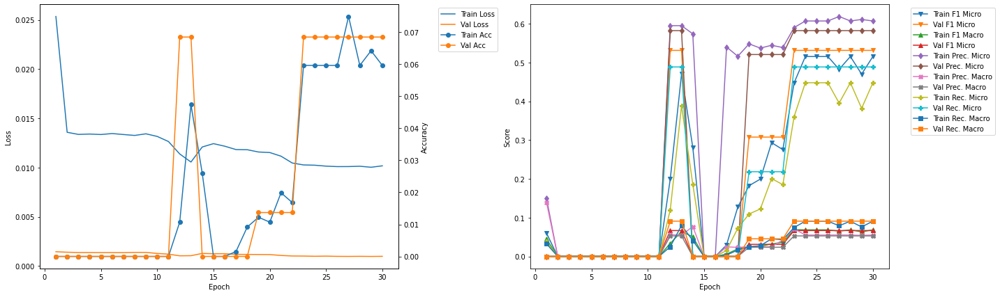

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 6.29
Train Loss: 0.0132 	Validation Loss: 0.0013
Train Accuracy: 0.0107 	Validation Accuracy: 0.0137
Train F1 Mirco: 0.1836 	Validation F1 Micro: 0.3077
Train F1 Marco: 0.0394 	Validation F1 Macro: 0.0332
Train Precision Mirco: 0.4449 	Validation Precision Micro: 0.5753
Train Precision Marco: 0.0833 	Validation Precision Macro: 0.0262
Train Recall Mirco: 0.1156 	Validation Recall Micro: 0.21
Train Recall Marco: 0.0307 	Validation Recall Macro: 0.0455

Validation F1 Micro Score Increased (0.531250 --> 0.560694).  Saving model ...

Epoch 2 	Learning Rate: 0.01 	Time (min): 6.51
Train Loss: 0.011 	Validation Loss: 0.0011
Train Accuracy: 0.0122 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.2598 	Validation F1 Micro: 0.5607
Train F1 Marco: 0.042 	Validation F1 Macro: 0.0723
Train Precision Mirco: 0.5281 	Validation Precision Micro: 0.6644
Train Precision 

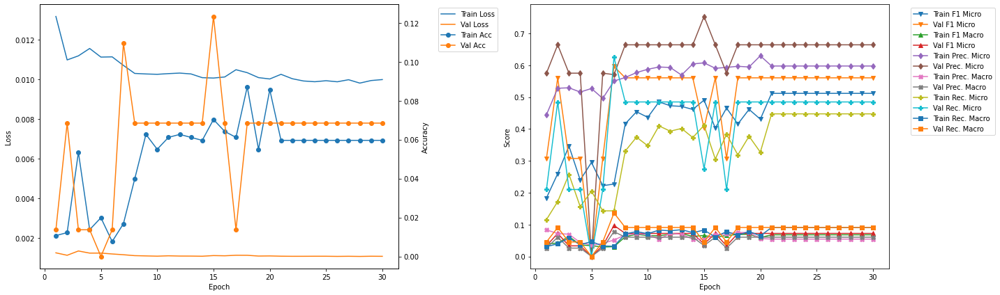

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 12.4
Train Loss: 0.0125 	Validation Loss: 0.0012
Train Accuracy: 0.0092 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.0803 	Validation F1 Micro: 0.4457
Train F1 Marco: 0.028 	Validation F1 Macro: 0.0628
Train Precision Mirco: 0.215 	Validation Precision Micro: 0.5342
Train Precision Marco: 0.0736 	Validation Precision Macro: 0.0486
Train Recall Mirco: 0.0493 	Validation Recall Micro: 0.3824
Train Recall Marco: 0.0362 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 12.61
Train Loss: 0.0104 	Validation Loss: 0.0011
Train Accuracy: 0.052 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4013 	Validation F1 Micro: 0.5371
Train F1 Marco: 0.0634 	Validation F1 Macro: 0.0712
Train Precision Mirco: 0.5658 	Validation Precision Micro: 0.6438
Train Precision Marco: 0.0722 	Validation Precision Macro: 0.0585
Train Recall Mirco: 0.311 	V

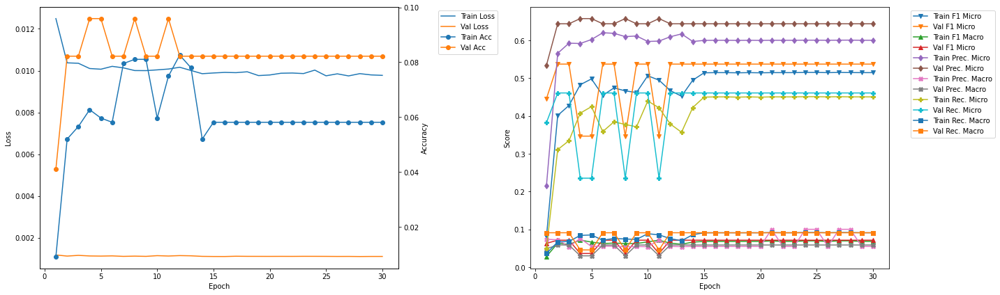

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 18.5
Train Loss: 0.0102 	Validation Loss: 0.0014
Train Accuracy: 0.0566 	Validation Accuracy: 0.0137
Train F1 Mirco: 0.4598 	Validation F1 Micro: 0.2222
Train F1 Marco: 0.0667 	Validation F1 Macro: 0.0283
Train Precision Mirco: 0.593 	Validation Precision Micro: 0.4521
Train Precision Marco: 0.1026 	Validation Precision Macro: 0.0205
Train Recall Mirco: 0.3755 	Validation Recall Micro: 0.1473
Train Recall Marco: 0.0775 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 18.7
Train Loss: 0.0098 	Validation Loss: 0.0014
Train Accuracy: 0.0642 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.4894 	Validation F1 Micro: 0.3367
Train F1 Marco: 0.065 	Validation F1 Macro: 0.037
Train Precision Mirco: 0.6101 	Validation Precision Micro: 0.6849
Train Precision Marco: 0.055 	Validation Precision Macro: 0.0311
Train Recall Mirco: 0.4086 	Va

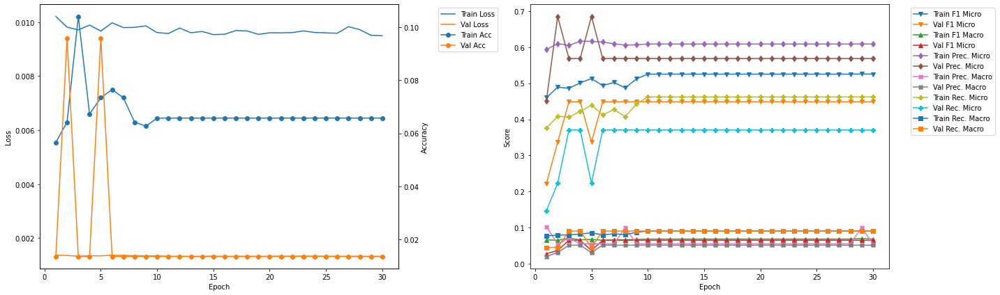

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 24.58
Train Loss: 0.0111 	Validation Loss: 0.0011
Train Accuracy: 0.0352 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.3258 	Validation F1 Micro: 0.5353
Train F1 Marco: 0.0528 	Validation F1 Macro: 0.0697
Train Precision Mirco: 0.5804 	Validation Precision Micro: 0.6233
Train Precision Marco: 0.1141 	Validation Precision Macro: 0.0567
Train Recall Mirco: 0.2265 	Validation Recall Micro: 0.4691
Train Recall Marco: 0.0472 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 24.79
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0719 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.4726 	Validation F1 Micro: 0.5353
Train F1 Marco: 0.0634 	Validation F1 Macro: 0.0697
Train Precision Mirco: 0.6101 	Validation Precision Micro: 0.6233
Train Precision Marco: 0.0543 	Validation Precision Macro: 0.0567
Train Recall Mirco: 0.38

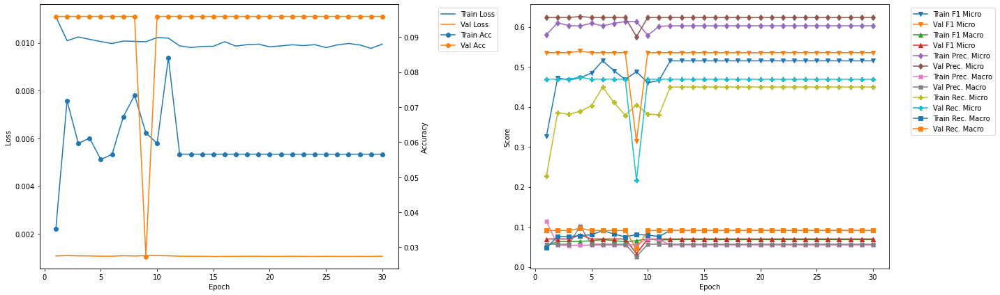

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 30.66
Train Loss: 0.0105 	Validation Loss: 0.0011
Train Accuracy: 0.0413 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.4342 	Validation F1 Micro: 0.5104
Train F1 Marco: 0.0663 	Validation F1 Macro: 0.0672
Train Precision Mirco: 0.5952 	Validation Precision Micro: 0.589
Train Precision Marco: 0.0742 	Validation Precision Macro: 0.0535
Train Recall Mirco: 0.3417 	Validation Recall Micro: 0.4503
Train Recall Marco: 0.0709 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 30.87
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0887 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.4407 	Validation F1 Micro: 0.5104
Train F1 Marco: 0.0586 	Validation F1 Macro: 0.0672
Train Precision Mirco: 0.6242 	Validation Precision Micro: 0.589
Train Precision Marco: 0.0544 	Validation Precision Macro: 0.0535
Train Recall Mirco: 0.3405

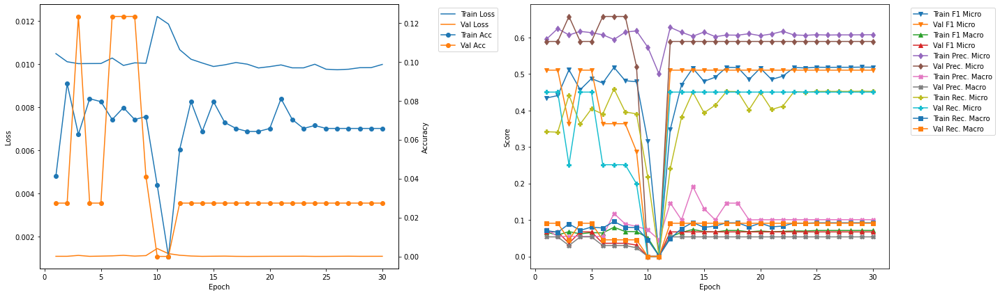

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 36.75
Train Loss: 0.0109 	Validation Loss: 0.0012
Train Accuracy: 0.0566 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.3914 	Validation F1 Micro: 0.51
Train F1 Marco: 0.0703 	Validation F1 Macro: 0.0689
Train Precision Mirco: 0.5716 	Validation Precision Micro: 0.6096
Train Precision Marco: 0.1223 	Validation Precision Macro: 0.0554
Train Recall Mirco: 0.2976 	Validation Recall Micro: 0.4384
Train Recall Marco: 0.0656 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 36.95
Train Loss: 0.0101 	Validation Loss: 0.0012
Train Accuracy: 0.078 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4814 	Validation F1 Micro: 0.51
Train F1 Marco: 0.066 	Validation F1 Macro: 0.0689
Train Precision Mirco: 0.6216 	Validation Precision Micro: 0.6096
Train Precision Marco: 0.0784 	Validation Precision Macro: 0.0554
Train Recall Mirco: 0.3928 	Va

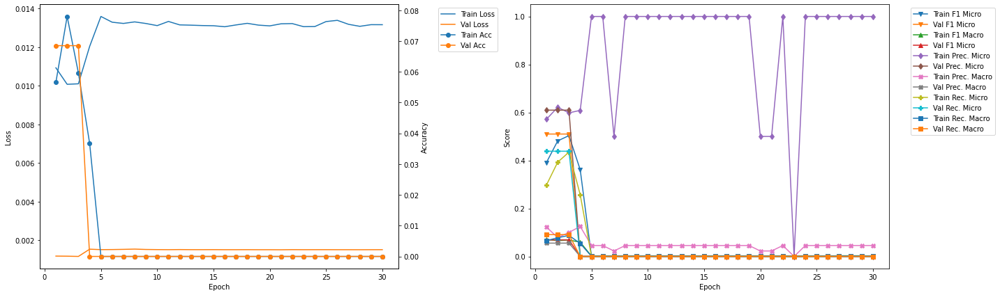

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 42.83
Train Loss: 0.0138 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0034 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0034 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.12 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0492 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0017 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0021 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 43.03
Train Loss: 0.0134 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0011 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0013 	Validation F1 Macro: 0.0
Train Precision Mirco: 1.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0455 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0006 	Validation Recall Micro: 0.0
Train Recall M

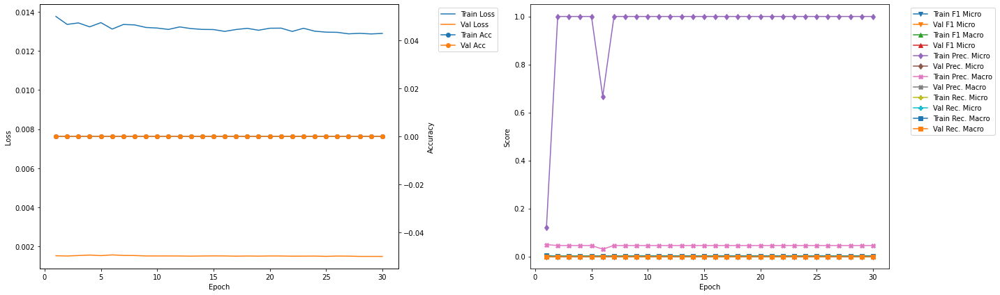

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 48.9
Train Loss: 0.0142 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0023 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0027 	Validation F1 Macro: 0.0
Train Precision Mirco: 1.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0455 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0011 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0014 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 49.1
Train Loss: 0.0133 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0023 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0027 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.6667 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0303 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0011 	Validation Recall Micro: 0.0
Train Recall M

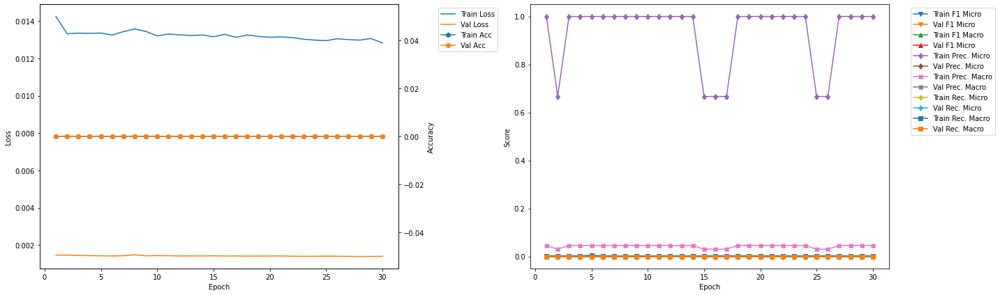

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 54.97
Train Loss: 0.0158 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.054 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0331 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1534 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1321 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0327 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0266 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 55.18
Train Loss: 0.0134 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0023 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0026 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.6667 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0303 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0011 	Validation Recall Micro: 0.0
Train Rec

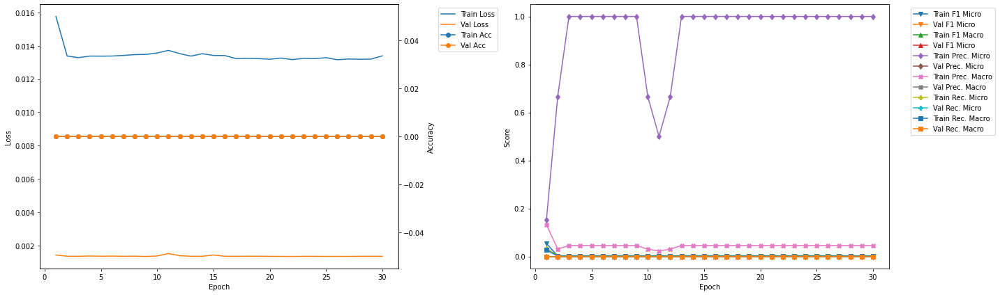

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 2 	Epoch: 7
Train Loss: 0.0107 	Validation Loss: 0.0012
Train Accuracy: 0.0168 	Validation Accuracy: 0.1096
Train F1 Mirco: 0.2272 	Validation F1 Micro: 0.5967
Train F1 Marco: 0.0306 	Validation F1 Macro: 0.0975
Train Precision Mirco: 0.5507 	Validation Precision Micro: 0.5708
Train Precision Marco: 0.0516 	Validation Precision Macro: 0.0778
Train Recall Mirco: 0.1431 	Validation Recall Micro: 0.625
Train Recall Marco: 0.0319 	Validation Recall Macro: 0.1364


In [27]:
vgg16bnLSTM_700_1_0_best = Kfold_train_CNN_RNN(model = vgg16bnLSTM_700_1_0, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'vgg16bnLSTM_700_1_0')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.21
Train Loss: 0.0183 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0563 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0426 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1312 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1158 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0359 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0442 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.42
Train Loss: 0.0136 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	V

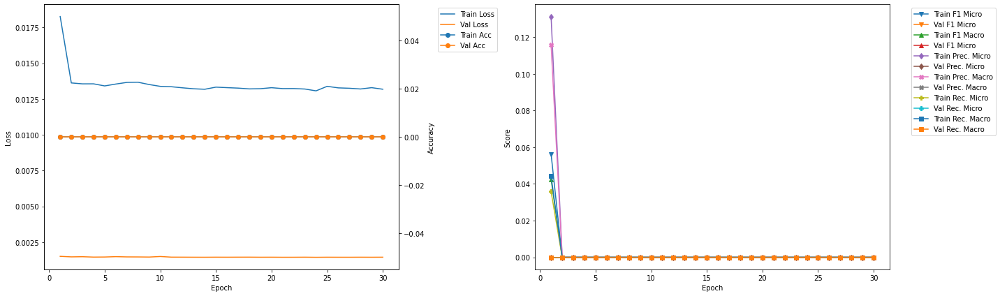

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 6.52
Train Loss: 0.0138 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 6.73
Train Loss: 0.0137 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall M

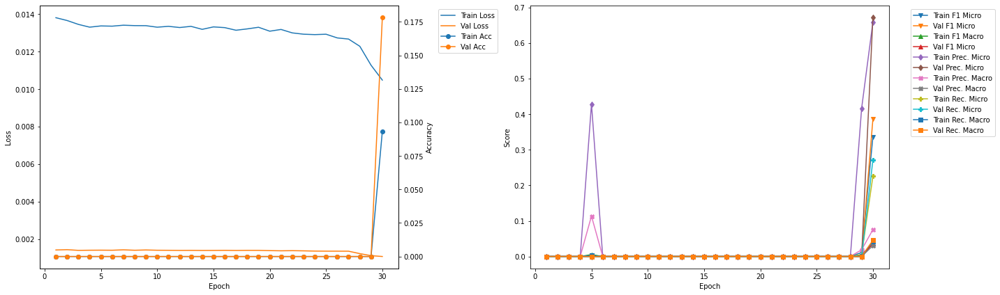

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 12.83
Train Loss: 0.0138 	Validation Loss: 0.0015
Train Accuracy: 0.0046 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0179 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0032 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.64 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0291 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0091 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0017 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 13.04
Train Loss: 0.0135 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0

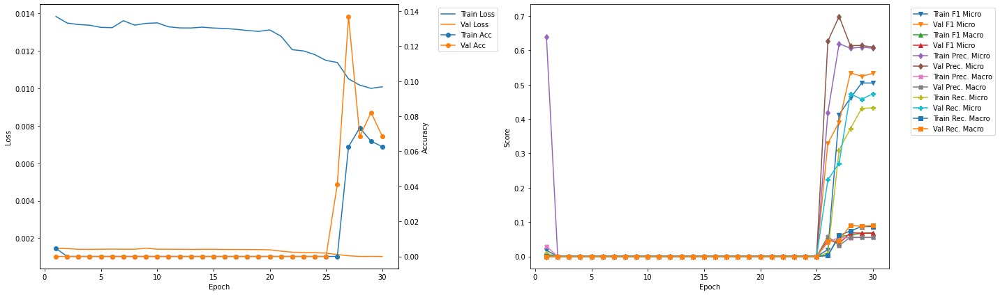

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 19.17
Train Loss: 0.0119 	Validation Loss: 0.0014
Train Accuracy: 0.0352 	Validation Accuracy: 0.0
Train F1 Mirco: 0.1936 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0353 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.5556 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0694 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.1172 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0267 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 19.38
Train Loss: 0.0112 	Validation Loss: 0.0014
Train Accuracy: 0.0505 	Validation Accuracy: 0.0
Train F1 Mirco: 0.2092 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0286 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.5822 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0548 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.1275 	Validation Recall Micro: 0.0
Tra

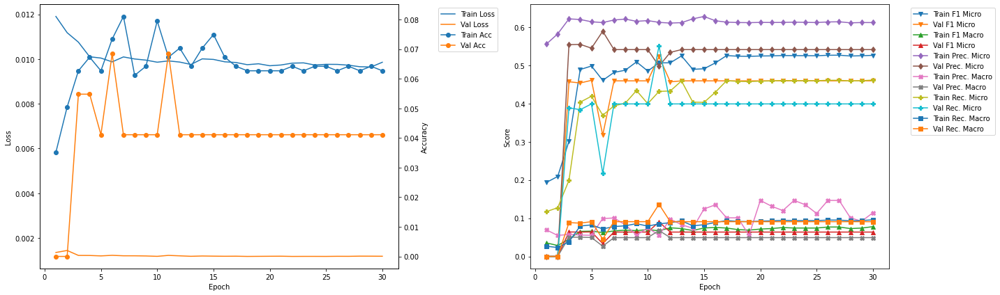

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 25.48
Train Loss: 0.0103 	Validation Loss: 0.0011
Train Accuracy: 0.0489 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.435 	Validation F1 Micro: 0.3866
Train F1 Marco: 0.0716 	Validation F1 Macro: 0.0378
Train Precision Mirco: 0.5837 	Validation Precision Micro: 0.7123
Train Precision Marco: 0.1322 	Validation Precision Macro: 0.0324
Train Recall Mirco: 0.3467 	Validation Recall Micro: 0.2653
Train Recall Marco: 0.0737 	Validation Recall Macro: 0.0455

Validation F1 Micro Score Increased (0.534535 --> 0.539759).  Saving model ...

Epoch 2 	Learning Rate: 0.01 	Time (min): 25.71
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.0535 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4426 	Validation F1 Micro: 0.5398
Train F1 Marco: 0.0633 	Validation F1 Macro: 0.0903
Train Precision Mirco: 0.595 	Validation Precision Micro: 0.5114
Train Precisio

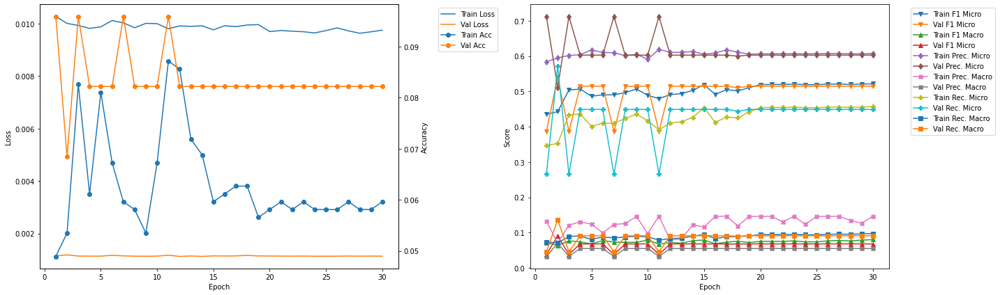

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 31.8
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0627 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4799 	Validation F1 Micro: 0.5172
Train F1 Marco: 0.0691 	Validation F1 Macro: 0.0793
Train Precision Mirco: 0.607 	Validation Precision Micro: 0.6207
Train Precision Marco: 0.1026 	Validation Precision Macro: 0.1016
Train Recall Mirco: 0.3968 	Validation Recall Micro: 0.4433
Train Recall Marco: 0.0806 	Validation Recall Macro: 0.0956

Epoch 2 	Learning Rate: 0.01 	Time (min): 32.01
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0749 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4489 	Validation F1 Micro: 0.5158
Train F1 Marco: 0.0664 	Validation F1 Macro: 0.0693
Train Precision Mirco: 0.6175 	Validation Precision Micro: 0.6164
Train Precision Marco: 0.1267 	Validation Precision Macro: 0.056
Train Recall Mirco: 0.3526 

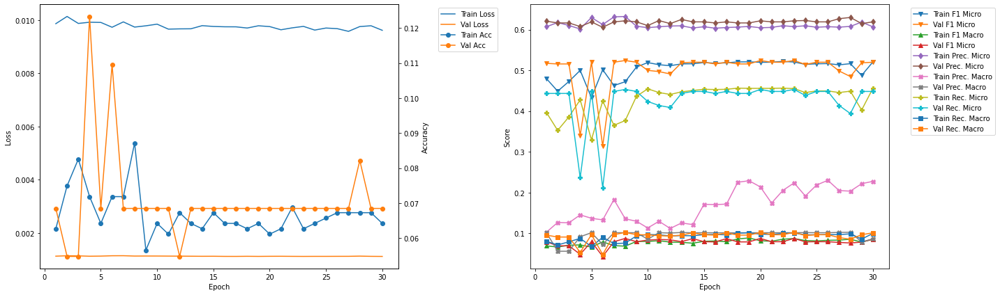

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 38.1
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0749 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.4878 	Validation F1 Micro: 0.4986
Train F1 Marco: 0.0813 	Validation F1 Macro: 0.0892
Train Precision Mirco: 0.6098 	Validation Precision Micro: 0.585
Train Precision Marco: 0.2207 	Validation Precision Macro: 0.0981
Train Recall Mirco: 0.4065 	Validation Recall Micro: 0.4343
Train Recall Marco: 0.0871 	Validation Recall Macro: 0.1061

Epoch 2 	Learning Rate: 0.01 	Time (min): 38.31
Train Loss: 0.0103 	Validation Loss: 0.0011
Train Accuracy: 0.0642 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.4953 	Validation F1 Micro: 0.4971
Train F1 Marco: 0.0711 	Validation F1 Macro: 0.0889
Train Precision Mirco: 0.5973 	Validation Precision Micro: 0.5811
Train Precision Marco: 0.0969 	Validation Precision Macro: 0.0978
Train Recall Mirco: 0.4231 	

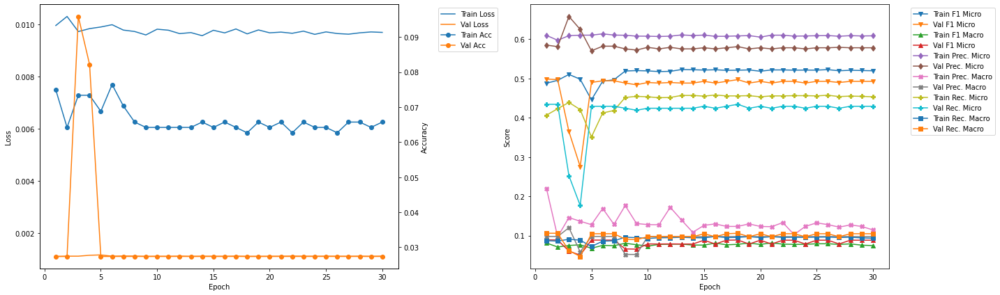

-------------------------------------------
FOLD 8
-------------------------------------------
Validation F1 Micro Score Increased (0.539759 --> 0.552326).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 44.43
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0748 	Validation Accuracy: 0.0972
Train F1 Mirco: 0.4683 	Validation F1 Micro: 0.5523
Train F1 Marco: 0.0753 	Validation F1 Macro: 0.0721
Train Precision Mirco: 0.613 	Validation Precision Micro: 0.6597
Train Precision Marco: 0.1362 	Validation Precision Macro: 0.06
Train Recall Mirco: 0.3789 	Validation Recall Micro: 0.475
Train Recall Marco: 0.0801 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 44.64
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0718 	Validation Accuracy: 0.0972
Train F1 Mirco: 0.4744 	Validation F1 Micro: 0.4029
Train F1 Marco: 0.0745 	Validation F1 Macro: 0.0455
Train Precision Mirco: 0.6071 	Validation Precision Micro: 0.7179
Train Precision 

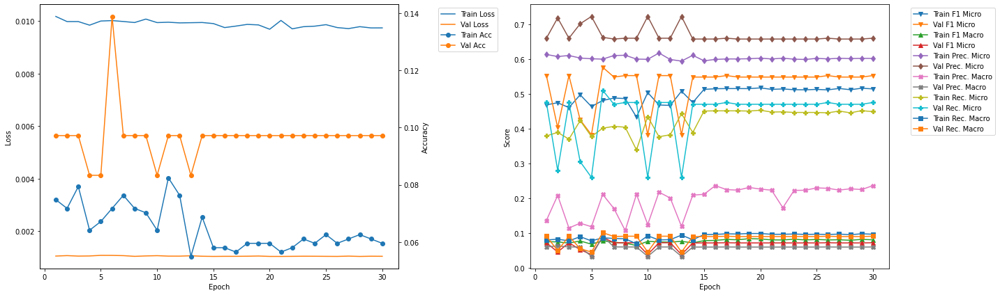

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 50.75
Train Loss: 0.0097 	Validation Loss: 0.0012
Train Accuracy: 0.0687 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.5178 	Validation F1 Micro: 0.3443
Train F1 Marco: 0.0827 	Validation F1 Macro: 0.0467
Train Precision Mirco: 0.6123 	Validation Precision Micro: 0.6184
Train Precision Marco: 0.2258 	Validation Precision Macro: 0.096
Train Recall Mirco: 0.4486 	Validation Recall Micro: 0.2386
Train Recall Marco: 0.0961 	Validation Recall Macro: 0.0525

Epoch 2 	Learning Rate: 0.01 	Time (min): 50.96
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0748 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.4887 	Validation F1 Micro: 0.4781
Train F1 Marco: 0.0837 	Validation F1 Macro: 0.0729
Train Precision Mirco: 0.6129 	Validation Precision Micro: 0.5616
Train Precision Marco: 0.2403 	Validation Precision Macro: 0.0739
Train Recall Mirco: 0.406

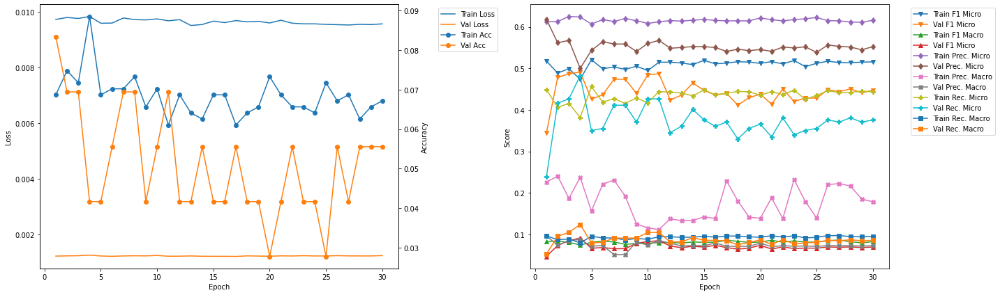

-------------------------------------------
FOLD 10
-------------------------------------------
Validation F1 Micro Score Increased (0.576271 --> 0.601770).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 57.07
Train Loss: 0.0102 	Validation Loss: 0.001
Train Accuracy: 0.0733 	Validation Accuracy: 0.0972
Train F1 Mirco: 0.4364 	Validation F1 Micro: 0.6018
Train F1 Marco: 0.0787 	Validation F1 Macro: 0.0882
Train Precision Mirco: 0.592 	Validation Precision Micro: 0.7133
Train Precision Marco: 0.1908 	Validation Precision Macro: 0.1101
Train Recall Mirco: 0.3455 	Validation Recall Micro: 0.5204
Train Recall Marco: 0.0767 	Validation Recall Macro: 0.0975

Epoch 2 	Learning Rate: 0.01 	Time (min): 57.28
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0748 	Validation Accuracy: 0.0972
Train F1 Mirco: 0.4595 	Validation F1 Micro: 0.597
Train F1 Marco: 0.0734 	Validation F1 Macro: 0.0753
Train Precision Mirco: 0.6122 	Validation Precision Micro: 0.7194
Train Precision

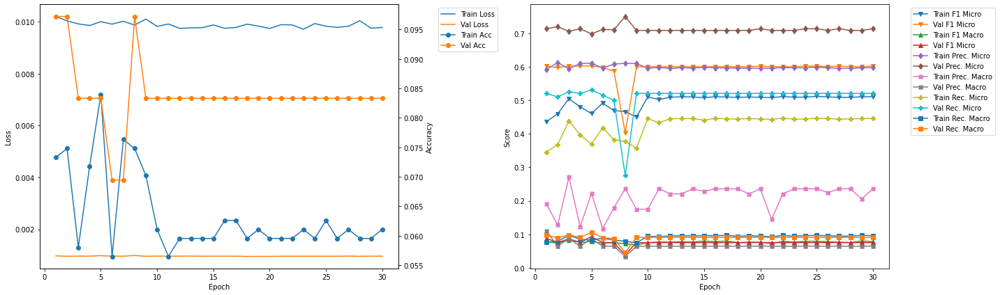

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 10 	Epoch: 5
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.084 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.4605 	Validation F1 Micro: 0.6029
Train F1 Marco: 0.0787 	Validation F1 Macro: 0.0935
Train Precision Mirco: 0.611 	Validation Precision Micro: 0.698
Train Precision Marco: 0.222 	Validation Precision Macro: 0.0871
Train Recall Mirco: 0.3695 	Validation Recall Micro: 0.5306
Train Recall Marco: 0.082 	Validation Recall Macro: 0.1061


In [28]:
vgg19bnLSTM_700_1_0_best = Kfold_train_CNN_RNN(model = vgg19bnLSTM_700_1_0, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'vgg19bnLSTM_700_1_0')

In [29]:
print('Total Training Time (HR:M:S): ' + str(datetime.timedelta(hours = ((time.time() - START) / 60 / 60))).rsplit('.', 1)[0])

Total Training Time (HR:M:S): 7:28:51


## Training Summary

### Summary Table

In [30]:
summaryDF = pd.DataFrame({
    'ResNet18' : resnet18LSTM_700_1_0_best,
    'ResNet50' : resnet50LSTM_700_1_0_best,
    'ResNet101' : resnet101LSTM_700_1_0_best,
    'DenseNet121' : densenet121LSTM_700_1_0_best,
    'DenseNet169' : densenet169LSTM_700_1_0_best,
    'DenseNet201' : densenet201LSTM_700_1_0_best,
    'VGG11_BN' : vgg11bnLSTM_700_1_0_best,
    'VGG16_BN' : vgg16bnLSTM_700_1_0_best,
    'VGG19_BN' : vgg19bnLSTM_700_1_0_best
})
summaryDF.index = ['Fold', 'Epoch', 'Train Loss', 'Train Accuracy', 'Train F1 Micro', 'Train F1 Macro', 'Train Precision Micro', 'Train Precision Macro', 'Train Recall Micro', 'Train Recall Macro',
                   'Val Loss', 'Val Accuracy', 'Val F1 Micro', 'Val F1 Macro', 'Val Precision Micro', 'Val Precision Macro', 'Val Recall Micro', 'Val Recall Macro']

summaryDF

,ResNet18,ResNet50,ResNet101,DenseNet121,DenseNet169,DenseNet201,VGG11_BN,VGG16_BN,VGG19_BN
Fold,9.000000,2.000000,10.000000,0,6.000000,4.000000,4.000000,2.000000,10.000000
Epoch,7.000000,2.000000,5.000000,0,29.000000,1.000000,1.000000,7.000000,5.000000
Train Loss,0.010063,0.010668,0.010210,0,0.009804,0.010065,0.009996,0.010698,0.010001
Train Accuracy,0.076336,0.051988,0.054962,0,0.058104,0.059633,0.067278,0.016820,0.083969
Train F1 Micro,0.478112,0.296965,0.506867,0,0.511002,0.490362,0.495504,0.227169,0.460498
Train F1 Macro,0.064220,0.053668,0.067707,0,0.069036,0.065527,0.070161,0.030628,0.078732
Train Precision Micro,0.602586,0.535503,0.603113,0,0.594347,0.600166,0.591415,0.550661,0.610954
Train Precision Macro,0.053950,0.076794,0.054922,0,0.099458,0.054040,0.066388,0.051566,0.221996
Train Recall Micro,0.396259,0.205448,0.437112,0,0.448157,0.414523,0.426361,0.143102,0.369503
Train Recall Macro,0.079353,0.044577,0.088915,0,0.091642,0.083247,0.086649,0.031885,0.082002


### Training Summary Graph

In [31]:
import plotly
import plotly.graph_objects as go

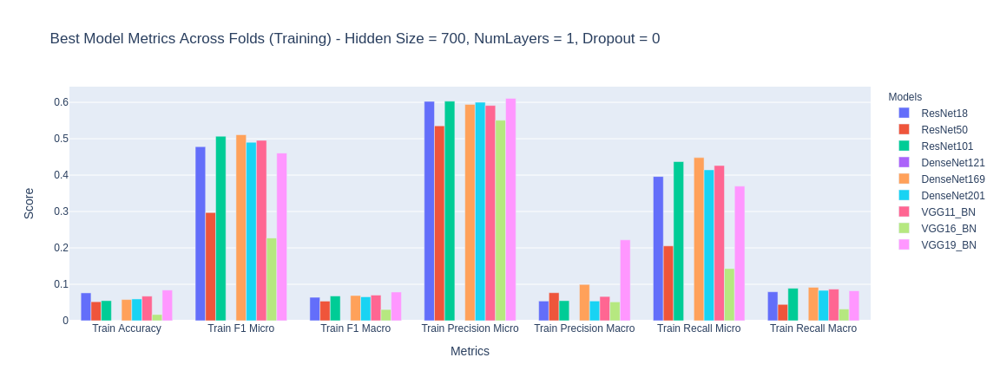

In [32]:
fig = go.Figure(data = [
    go.Bar(name = 'ResNet18', x = summaryDF.index[3:10], y = summaryDF['ResNet18'][3:10]),
    go.Bar(name = 'ResNet50', x = summaryDF.index[3:10], y = summaryDF['ResNet50'][3:10]),
    go.Bar(name = 'ResNet101', x = summaryDF.index[3:10], y = summaryDF['ResNet101'][3:10]),
    go.Bar(name = 'DenseNet121', x = summaryDF.index[3:10], y = summaryDF['DenseNet121'][3:10]),
    go.Bar(name = 'DenseNet169', x = summaryDF.index[3:10], y = summaryDF['DenseNet169'][3:10]),
    go.Bar(name = 'DenseNet201', x = summaryDF.index[3:10], y = summaryDF['DenseNet201'][3:10]),
    go.Bar(name = 'VGG11_BN', x = summaryDF.index[3:10], y = summaryDF['VGG11_BN'][3:10]),
    go.Bar(name = 'VGG16_BN', x = summaryDF.index[3:10], y = summaryDF['VGG16_BN'][3:10]),
    go.Bar(name = 'VGG19_BN', x = summaryDF.index[3:10], y = summaryDF['VGG19_BN'][3:10]),
])
fig.update_layout(barmode = 'group',
                  title = 'Best Model Metrics Across Folds (Training) - Hidden Size = 700, NumLayers = 1, Dropout = 0',
                  xaxis_title = 'Metrics',
                  yaxis_title = 'Score',
                  legend_title = 'Models')
fig.show()

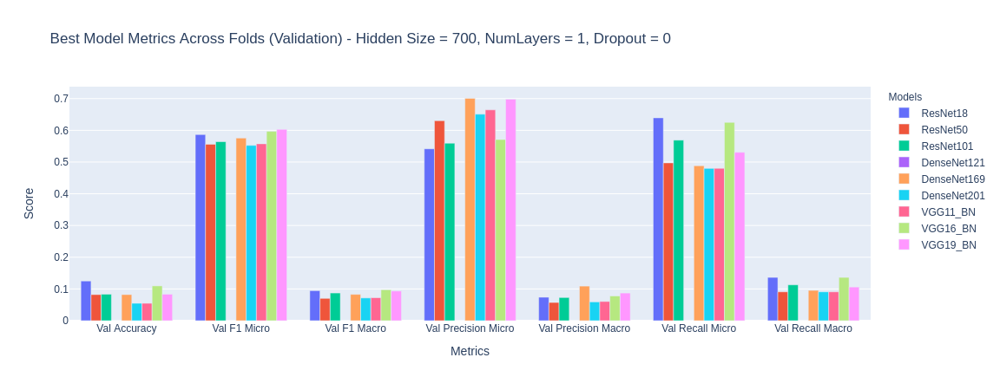

In [33]:
fig = go.Figure(data = [
    go.Bar(name = 'ResNet18', x = summaryDF.index[11:], y = summaryDF['ResNet18'][11:]),
    go.Bar(name = 'ResNet50', x = summaryDF.index[11:], y = summaryDF['ResNet50'][11:]),
    go.Bar(name = 'ResNet101', x = summaryDF.index[11:], y = summaryDF['ResNet101'][11:]),
    go.Bar(name = 'DenseNet121', x = summaryDF.index[11:], y = summaryDF['DenseNet121'][11:]),
    go.Bar(name = 'DenseNet169', x = summaryDF.index[11:], y = summaryDF['DenseNet169'][11:]),
    go.Bar(name = 'DenseNet201', x = summaryDF.index[11:], y = summaryDF['DenseNet201'][11:]),
    go.Bar(name = 'VGG11_BN', x = summaryDF.index[11:], y = summaryDF['VGG11_BN'][11:]),
    go.Bar(name = 'VGG16_BN', x = summaryDF.index[11:], y = summaryDF['VGG16_BN'][11:]),
    go.Bar(name = 'VGG19_BN', x = summaryDF.index[11:], y = summaryDF['VGG19_BN'][11:]),
])
fig.update_layout(barmode = 'group',
                  title = 'Best Model Metrics Across Folds (Validation) - Hidden Size = 700, NumLayers = 1, Dropout = 0',
                  xaxis_title = 'Metrics',
                  yaxis_title = 'Score',
                  legend_title = 'Models')
fig.show()